In [0]:
# # %tensorflow_version only exists in Colab.
%tensorflow_version 2.x

# Generative Adversarial Networks (GANs)
So far in CS231N, all the applications of neural networks that we have explored have been **discriminative models** that take an input and are trained to produce a labeled output. This has ranged from straightforward classification of image categories to sentence generation (which was still phrased as a classification problem, our labels were in vocabulary space and we’d learned a recurrence to capture multi-word labels). In this notebook, we will expand our repetoire, and build **generative models** using neural networks. Specifically, we will learn how to build models which generate novel images that resemble a set of training images.

### What is a GAN?

In 2014, [Goodfellow et al.](https://arxiv.org/abs/1406.2661) presented a method for training generative models called Generative Adversarial Networks (GANs for short). In a GAN, we build two different neural networks. Our first network is a traditional classification network, called the **discriminator**. We will train the discriminator to take images, and classify them as being real (belonging to the training set) or fake (not present in the training set). Our other network, called the **generator**, will take random noise as input and transform it using a neural network to produce images. The goal of the generator is to fool the discriminator into thinking the images it produced are real.

We can think of this back and forth process of the generator ($G$) trying to fool the discriminator ($D$), and the discriminator trying to correctly classify real vs. fake as a minimax game:
$$\underset{G}{\text{minimize}}\; \underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
where $x \sim p_\text{data}$ are samples from the input data, $z \sim p(z)$ are the random noise samples, $G(z)$ are the generated images using the neural network generator $G$, and $D$ is the output of the discriminator, specifying the probability of an input being real. In [Goodfellow et al.](https://arxiv.org/abs/1406.2661), they analyze this minimax game and show how it relates to minimizing the Jensen-Shannon divergence between the training data distribution and the generated samples from $G$.

To optimize this minimax game, we will aternate between taking gradient *descent* steps on the objective for $G$, and gradient *ascent* steps on the objective for $D$:
1. update the **generator** ($G$) to minimize the probability of the __discriminator making the correct choice__. 
2. update the **discriminator** ($D$) to maximize the probability of the __discriminator making the correct choice__.

While these updates are useful for analysis, they do not perform well in practice. Instead, we will use a different objective when we update the generator: maximize the probability of the **discriminator making the incorrect choice**. This small change helps to allevaiate problems with the generator gradient vanishing when the discriminator is confident. This is the standard update used in most GAN papers, and was used in the original paper from [Goodfellow et al.](https://arxiv.org/abs/1406.2661). 

In this assignment, we will alternate the following updates:
1. Update the generator ($G$) to maximize the probability of the discriminator making the incorrect choice on generated data:
$$\underset{G}{\text{maximize}}\;  \mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
2. Update the discriminator ($D$), to maximize the probability of the discriminator making the correct choice on real and generated data:
$$\underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$

### What else is there?
Since 2014, GANs have exploded into a huge research area, with massive [workshops](https://sites.google.com/site/nips2016adversarial/), and [hundreds of new papers](https://github.com/hindupuravinash/the-gan-zoo). Compared to other approaches for generative models, they often produce the highest quality samples but are some of the most difficult and finicky models to train (see [this github repo](https://github.com/soumith/ganhacks) that contains a set of 17 hacks that are useful for getting models working). Improving the stabiilty and robustness of GAN training is an open research question, with new papers coming out every day! For a more recent tutorial on GANs, see [here](https://arxiv.org/abs/1701.00160). There is also some even more recent exciting work that changes the objective function to Wasserstein distance and yields much more stable results across model architectures: [WGAN](https://arxiv.org/abs/1701.07875), [WGAN-GP](https://arxiv.org/abs/1704.00028).


GANs are not the only way to train a generative model! For other approaches to generative modeling check out the [deep generative model chapter](http://www.deeplearningbook.org/contents/generative_models.html) of the Deep Learning [book](http://www.deeplearningbook.org). Another popular way of training neural networks as generative models is Variational Autoencoders (co-discovered [here](https://arxiv.org/abs/1312.6114) and [here](https://arxiv.org/abs/1401.4082)). Variational autoencoders combine neural networks with variational inference to train deep generative models. These models tend to be far more stable and easier to train but currently don't produce samples that are as pretty as GANs.

Example pictures of what you should expect (yours might look slightly different):

![GAN examples](https://drive.google.com/uc?id=1UP1VpQ8w-VjT9mckx_aRXMvZrQoy6zpN)


## Setup

In [0]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

DRIVE_DIR = '/content/drive/My Drive/dl_homework/assign_4/assignment3/styles'

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [0]:
import tensorflow as tf
import numpy as np
import os

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
DRIVE_DIR = '/content/drive/My Drive/dl_homework/assign_4/assignment3'
%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

# A bunch of utility functions

def show_images(images):
    images = np.reshape(images, [images.shape[0], -1])  # images reshape to (batch_size, D)
    sqrtn = int(np.ceil(np.sqrt(images.shape[0])))
    sqrtimg = int(np.ceil(np.sqrt(images.shape[1])))

    fig = plt.figure(figsize=(sqrtn, sqrtn))
    gs = gridspec.GridSpec(sqrtn, sqrtn)
    gs.update(wspace=0.05, hspace=0.05)

    for i, img in enumerate(images):
        ax = plt.subplot(gs[i])
        plt.axis('off')
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        ax.set_aspect('equal')
        plt.imshow(img.reshape([sqrtimg,sqrtimg]))
    return

def preprocess_img(x):
    return 2 * x - 1.0

def deprocess_img(x):
    return (x + 1.0) / 2.0

def rel_error(x,y):
    return np.max(np.abs(x - y) / (np.maximum(1e-8, np.abs(x) + np.abs(y))))

def count_params(model):
    """Count the number of parameters in the current TensorFlow graph """
    param_count = np.sum([np.prod(p.shape) for p in model.weights])
    return param_count

answers = np.load(os.path.join(DRIVE_DIR, 'gan-checks-tf.npz'))

NOISE_DIM = 96

## Dataset
 GANs are notoriously finicky with hyperparameters, and also require many training epochs. In order to make this assignment approachable without a GPU, we will be working on the MNIST dataset, which is 60,000 training and 10,000 test images. Each picture contains a centered image of white digit on black background (0 through 9). This was one of the first datasets used to train convolutional neural networks and it is fairly easy -- a standard CNN model can easily exceed 99% accuracy. 
 

**Heads-up**: Our MNIST wrapper returns images as vectors. That is, they're size (batch, 784). If you want to treat them as images, we have to resize them to (batch,28,28) or (batch,28,28,1). They are also type np.float32 and bounded [0,1]. 

In [0]:
class MNIST(object):
    def __init__(self, batch_size, shuffle=False):
        """
        Construct an iterator object over the MNIST data
        
        Inputs:
        - batch_size: Integer giving number of elements per minibatch
        - shuffle: (optional) Boolean, whether to shuffle the data on each epoch
        """
        train, _ = tf.keras.datasets.mnist.load_data()
        X, y = train
        X = X.astype(np.float32)/255
        X = X.reshape((X.shape[0], -1))
        self.X, self.y = X, y
        self.batch_size, self.shuffle = batch_size, shuffle

    def __iter__(self):
        N, B = self.X.shape[0], self.batch_size
        idxs = np.arange(N)
        if self.shuffle:
            np.random.shuffle(idxs)
        return iter((self.X[i:i+B], self.y[i:i+B]) for i in range(0, N, B)) 

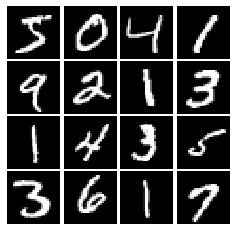

In [60]:
# show a batch
mnist = MNIST(batch_size=16) 
show_images(mnist.X[:16])

## LeakyReLU
In the cell below, you should implement a LeakyReLU. See the [class notes](http://cs231n.github.io/neural-networks-1/) (where alpha is small number) or equation (3) in [this paper](http://ai.stanford.edu/~amaas/papers/relu_hybrid_icml2013_final.pdf). LeakyReLUs keep ReLU units from dying and are often used in GAN methods (as are maxout units, however those increase model size and therefore are not used in this notebook).

HINT: You should be able to use `tf.maximum`

In [0]:
def leaky_relu(x, alpha=0.01):
    """Compute the leaky ReLU activation function.
    
    Inputs:
    - x: TensorFlow Tensor with arbitrary shape
    - alpha: leak parameter for leaky ReLU
    
    Returns:
    TensorFlow Tensor with the same shape as x
    """
    # TODO: implement leaky ReLU
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    result0=tf.maximum(x,alpha*x)
    
    return result0

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Test your leaky ReLU implementation. You should get errors < 1e-10

In [0]:
def test_leaky_relu(x, y_true):
    y = leaky_relu(tf.constant(x))
    print('Maximum error: %g'%rel_error(y_true, y))

test_leaky_relu(answers['lrelu_x'], answers['lrelu_y'])

Maximum error: 0


## Random Noise
Generate a TensorFlow `Tensor` containing uniform noise from -1 to 1 with shape `[batch_size, dim]`.

In [0]:
def sample_noise(batch_size, dim):
    """Generate random uniform noise from -1 to 1.
    
    Inputs:
    - batch_size: integer giving the batch size of noise to generate
    - dim: integer giving the dimension of the noise to generate
    
    Returns:
    TensorFlow Tensor containing uniform noise in [-1, 1] with shape [batch_size, dim]
    """
    # TODO: sample and return noise
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    noise=tf.random.uniform((batch_size, dim),-1,1)
    #noise=tf_print(noise)
    return noise

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Make sure noise is the correct shape and type:

In [0]:
def test_sample_noise():
    batch_size = 3
    dim = 4
    z = sample_noise(batch_size, dim)
    # Check z has the correct shape
    assert z.get_shape().as_list() == [batch_size, dim]
    # Make sure z is a Tensor and not a numpy array
    assert isinstance(z, tf.Tensor)
    # Check that we get different noise for different evaluations
    z1 = sample_noise(batch_size, dim)
    z2 = sample_noise(batch_size, dim)
    assert not np.array_equal(z1, z2)
    # Check that we get the correct range
    assert np.all(z1 >= -1.0) and np.all(z1 <= 1.0)
    print("All tests passed!")
    
test_sample_noise()

All tests passed!


## Discriminator
Our first step is to build a discriminator. **Hint:** You should use the layers in `tf.keras.layers` to build the model.
All fully connected layers should include bias terms. For initialization, just use the default initializer used by the `tf.keras.layers` functions.

Architecture:
 * Fully connected layer with input size 784 and output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 1 
 
The output of the discriminator should thus have shape `[batch_size, 1]`, and contain real numbers corresponding to the scores that each of the `batch_size` inputs is a real image.

In [0]:
def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

        tf.keras.layers.Dense(256,input_shape=(784,),activation=leaky_relu),
        tf.keras.layers.Dense(256,activation=leaky_relu),
        tf.keras.layers.Dense(1)

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the discriminator is correct:

In [73]:
def test_discriminator(true_count=267009):
    model = discriminator()
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in discriminator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in discriminator.')
        
test_discriminator()

Correct number of parameters in discriminator.


## Generator
Now to build a generator. You should use the layers in `tf.keras.layers` to construct the model. All fully connected layers should include bias terms. Note that you can use the tf.nn module to access activation functions. Once again, use the default initializers for parameters.

Architecture:
 * Fully connected layer with inupt size tf.shape(z)[1] (the number of noise dimensions) and output size 1024
 * `ReLU`
 * Fully connected layer with output size 1024 
 * `ReLU`
 * Fully connected layer with output size 784
 * `TanH` (To restrict every element of the output to be in the range [-1,1])

In [0]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        tf.keras.layers.Dense(1024,activation=tf.nn.relu,input_shape=(noise_dim,)),
        tf.keras.layers.Dense(1024,activation=tf.nn.relu),
        tf.keras.layers.Dense(784,activation=tf.nn.tanh)
        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the generator is correct:

In [0]:
def test_generator(true_count=1858320):
    model = generator(4)
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in generator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in generator.')
        
test_generator()

Correct number of parameters in generator.


# GAN Loss

Compute the generator and discriminator loss. The generator loss is:
$$\ell_G  =  -\mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
and the discriminator loss is:
$$ \ell_D = -\mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] - \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
Note that these are negated from the equations presented earlier as we will be *minimizing* these losses.

**HINTS**: Use [tf.ones](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/ones) and [tf.zeros](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/zeros) to generate labels for your discriminator. Use [tf.keras.losses.BinaryCrossentropy](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/losses/BinaryCrossentropy) to help compute your loss function.

In [0]:
def discriminator_loss(logits_real, logits_fake):
    """
    Computes the discriminator loss described above.
    
    Inputs:
    - logits_real: Tensor of shape (N, 1) giving scores for the real data.
    - logits_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Returns:
    - loss: Tensor containing (scalar) the loss for the discriminator.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    D_loss = None
    shape_fake=tf.shape(logits_fake)
    shape=tf.shape(logits_real)
    # pad_fake=tf.cast(tf.zeros(shape_fake),tf.double)
    # pad_1=tf.cast(tf.ones(shape),tf.double)
    pad_fake=tf.zeros(shape_fake)
    pad_1=tf.ones(shape)
    bce=tf.keras.losses.BinaryCrossentropy(from_logits=True)
    # D_loss=tf.reduce_mean(bce(pad_1,tf.nn.softmax(logits_real)))+tf.reduce_mean(bce(pad_fake,tf.nn.softmax(logits_fake)))
    D_loss=tf.reduce_mean(bce(pad_1,logits_real))+tf.reduce_mean(bce(pad_fake,logits_fake))
   
    loss=D_loss
    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def generator_loss(logits_fake):
    """
    Computes the generator loss described above.

    Inputs:
    - logits_fake: PyTorch Tensor of shape (N,) giving scores for the fake data.
    
    Returns:
    - loss: PyTorch Tensor containing the (scalar) loss for the generator.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    G_loss = None
    shape_fake=tf.shape(logits_fake)
    pad_1=tf.ones(shape_fake)
    bce=tf.keras.losses.BinaryCrossentropy(from_logits=True)
    # pad_1=tf.cast(tf.ones(shape_fake),tf.double)
    G_loss=tf.reduce_mean(bce(pad_1,logits_fake))
    loss=G_loss
    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your GAN loss. Make sure both the generator and discriminator loss are correct. You should see errors less than 1e-8.

In [92]:
def test_discriminator_loss(logits_real, logits_fake, d_loss_true):
    d_loss = discriminator_loss(tf.constant(logits_real),
                                tf.constant(logits_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))

test_discriminator_loss(answers['logits_real'], answers['logits_fake'],
                        answers['d_loss_true'])

Maximum error in d_loss: 3.97058e-09


In [94]:
def test_generator_loss(logits_fake, g_loss_true):
    g_loss = generator_loss(tf.constant(logits_fake))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_generator_loss(answers['logits_fake'], answers['g_loss_true'])

Maximum error in g_loss: 4.4518e-09


# Optimizing our loss
Make an `Adam` optimizer with a 1e-3 learning rate, beta1=0.5 to mininize G_loss and D_loss separately. The trick of decreasing beta was shown to be effective in helping GANs converge in the [Improved Techniques for Training GANs](https://arxiv.org/abs/1606.03498) paper. In fact, with our current hyperparameters, if you set beta1 to the Tensorflow default of 0.9, there's a good chance your discriminator loss will go to zero and the generator will fail to learn entirely. In fact, this is a common failure mode in GANs; if your D(x) learns too fast (e.g. loss goes near zero), your G(z) is never able to learn. Often D(x) is trained with SGD with Momentum or RMSProp instead of Adam, but here we'll use Adam for both D(x) and G(z). 

In [0]:
# TODO: create an AdamOptimizer for D_solver and G_solver
def get_solvers(learning_rate=1e-3, beta1=0.5):
    """Create solvers for GAN training.
    
    Inputs:
    - learning_rate: learning rate to use for both solvers
    - beta1: beta1 parameter for both solvers (first moment decay)
    
    Returns:
    - D_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    - G_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    """
    D_solver = None
    G_solver = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    D_solver=tf.optimizers.Adam(learning_rate=1e-3,beta_1=0.5)
    G_solver=tf.optimizers.Adam(learning_rate=1e-3,beta_1=0.5)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return D_solver, G_solver

# Training a GAN!
Well that wasn't so hard, was it? After the first epoch, you should see fuzzy outlines, clear shapes as you approach epoch 3, and decent shapes, about half of which will be sharp and clearly recognizable as we pass epoch 5. In our case, we'll simply train D(x) and G(z) with one batch each every iteration. However, papers often experiment with different schedules of training D(x) and G(z), sometimes doing one for more steps than the other, or even training each one until the loss gets "good enough" and then switching to training the other. 

In [0]:
# a giant helper function
def run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss,\
              show_every=20, print_every=20, batch_size=128, num_epochs=10, noise_size=96):
    """Train a GAN for a certain number of epochs.
    
    Inputs:
    - D: Discriminator model
    - G: Generator model
    - D_solver: an Optimizer for Discriminator
    - G_solver: an Optimizer for Generator
    - generator_loss: Generator loss
    - discriminator_loss: Discriminator loss
    Returns:
        Nothing
    """
    mnist = MNIST(batch_size=batch_size, shuffle=True)
    
    iter_count = 0
    for epoch in range(num_epochs):
        for (x, _) in mnist:
            with tf.GradientTape() as tape:
                real_data = x
                logits_real = D(preprocess_img(real_data))

                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)
                logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))

                d_total_error = discriminator_loss(logits_real, logits_fake)
                d_gradients = tape.gradient(d_total_error, D.trainable_variables)      
                D_solver.apply_gradients(zip(d_gradients, D.trainable_variables))
            
            with tf.GradientTape() as tape:
                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)

                gen_logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))
                g_error = generator_loss(gen_logits_fake)
                g_gradients = tape.gradient(g_error, G.trainable_variables)      
                G_solver.apply_gradients(zip(g_gradients, G.trainable_variables))

            if (iter_count % show_every == 0):
                print('Epoch: {}, Iter: {}, D: {:.4}, G:{:.4}'.format(epoch, iter_count,d_total_error,g_error))
                imgs_numpy = fake_images.cpu().numpy()
                show_images(imgs_numpy[0:16])
                plt.show()
            iter_count += 1
    
    # random noise fed into our generator
    z = sample_noise(batch_size, noise_size)
    # generated images
    G_sample = G(z)
    print('Final images')
    show_images(G_sample[:16])
    plt.show()

#### Train your GAN! This should take about 10 minutes on a CPU, or about 2 minutes on GPU.

Epoch: 0, Iter: 0, D: 1.187, G:0.6986


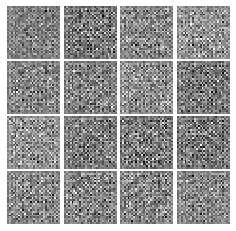

Epoch: 0, Iter: 20, D: 0.5731, G:0.921


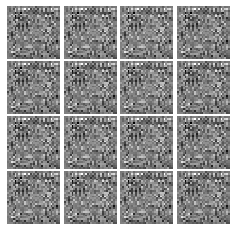

Epoch: 0, Iter: 40, D: 0.6015, G:0.937


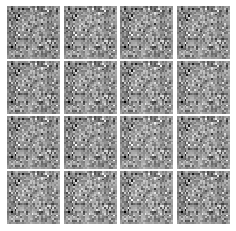

Epoch: 0, Iter: 60, D: 1.294, G:0.634


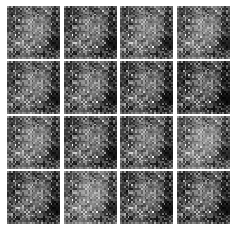

Epoch: 0, Iter: 80, D: 1.09, G:1.022


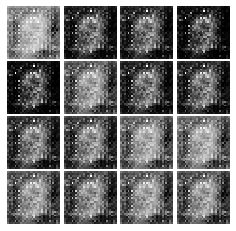

Epoch: 0, Iter: 100, D: 0.8834, G:1.505


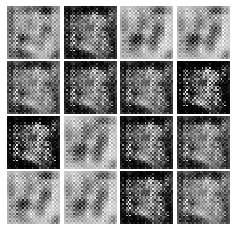

Epoch: 0, Iter: 120, D: 1.041, G:1.085


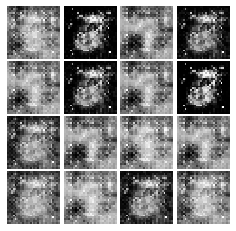

Epoch: 0, Iter: 140, D: 0.9858, G:1.265


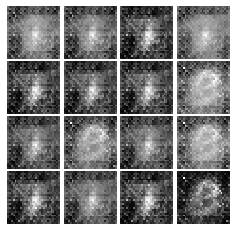

Epoch: 0, Iter: 160, D: 1.097, G:1.127


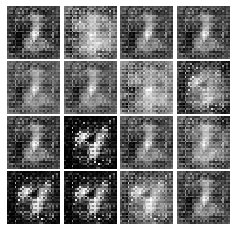

Epoch: 0, Iter: 180, D: 1.236, G:1.263


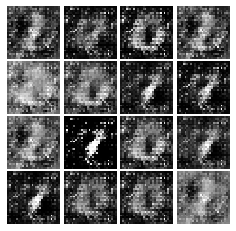

Epoch: 0, Iter: 200, D: 0.9624, G:1.191


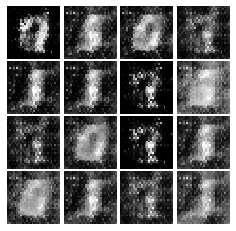

Epoch: 0, Iter: 220, D: 1.084, G:1.579


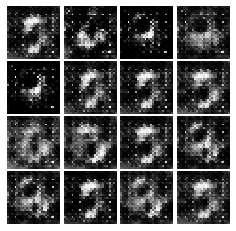

Epoch: 0, Iter: 240, D: 1.138, G:2.144


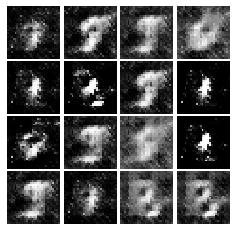

Epoch: 0, Iter: 260, D: 1.38, G:1.297


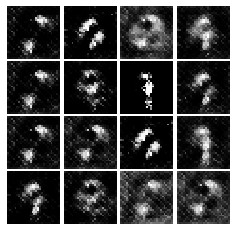

Epoch: 0, Iter: 280, D: 1.236, G:1.689


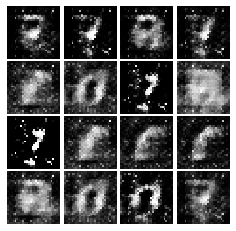

Epoch: 0, Iter: 300, D: 1.117, G:1.033


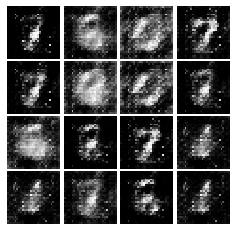

Epoch: 0, Iter: 320, D: 1.433, G:0.9074


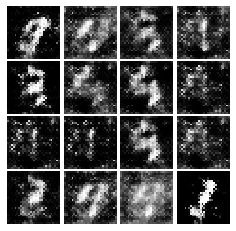

Epoch: 0, Iter: 340, D: 1.387, G:1.609


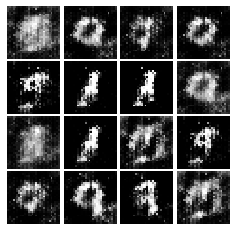

Epoch: 0, Iter: 360, D: 1.095, G:1.032


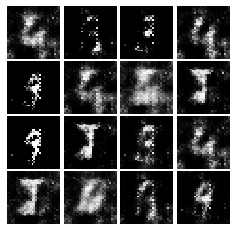

Epoch: 0, Iter: 380, D: 1.395, G:1.761


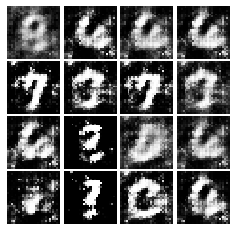

Epoch: 0, Iter: 400, D: 1.507, G:1.724


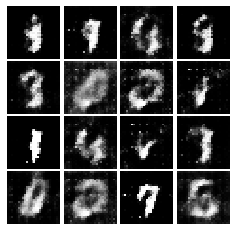

Epoch: 0, Iter: 420, D: 1.527, G:1.147


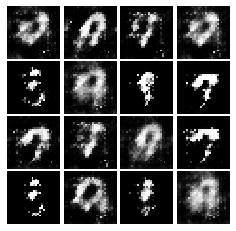

Epoch: 0, Iter: 440, D: 1.212, G:0.9627


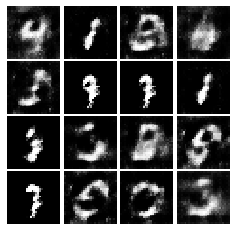

Epoch: 0, Iter: 460, D: 1.125, G:0.9419


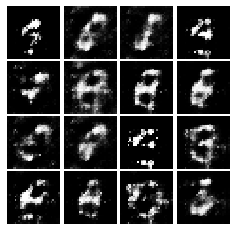

Epoch: 1, Iter: 480, D: 1.189, G:0.9942


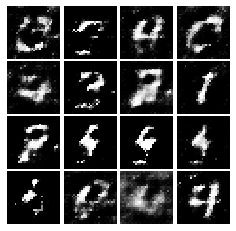

Epoch: 1, Iter: 500, D: 1.225, G:1.146


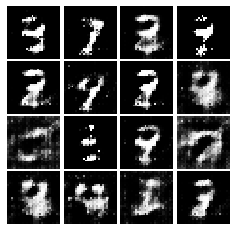

Epoch: 1, Iter: 520, D: 1.28, G:0.689


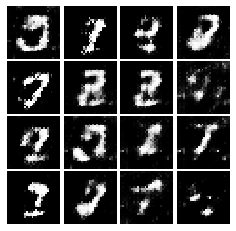

Epoch: 1, Iter: 540, D: 1.043, G:1.275


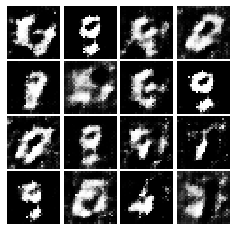

Epoch: 1, Iter: 560, D: 1.244, G:0.922


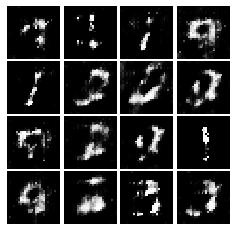

Epoch: 1, Iter: 580, D: 1.072, G:1.501


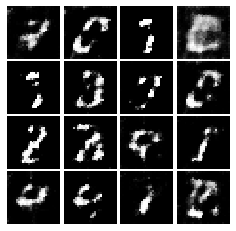

Epoch: 1, Iter: 600, D: 1.245, G:1.02


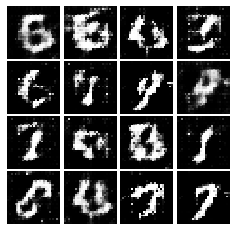

Epoch: 1, Iter: 620, D: 1.194, G:1.03


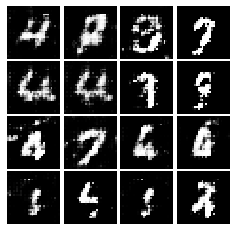

Epoch: 1, Iter: 640, D: 1.227, G:0.6442


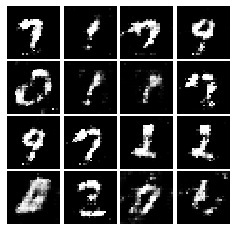

Epoch: 1, Iter: 660, D: 1.187, G:1.159


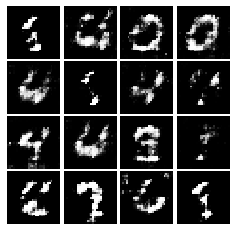

Epoch: 1, Iter: 680, D: 1.318, G:0.7774


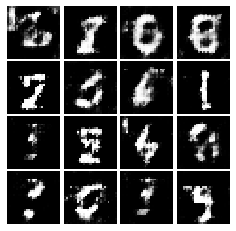

Epoch: 1, Iter: 700, D: 1.232, G:0.8891


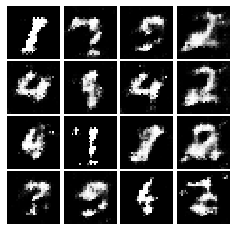

Epoch: 1, Iter: 720, D: 1.326, G:1.677


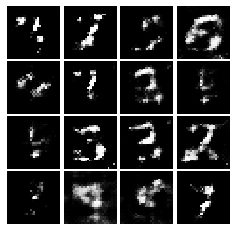

Epoch: 1, Iter: 740, D: 1.229, G:1.056


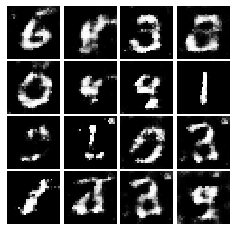

Epoch: 1, Iter: 760, D: 1.544, G:0.7651


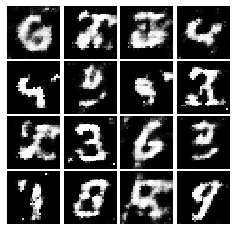

Epoch: 1, Iter: 780, D: 1.492, G:0.9267


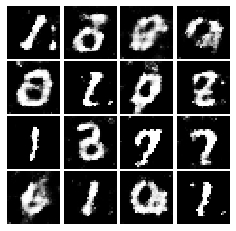

Epoch: 1, Iter: 800, D: 1.32, G:0.7455


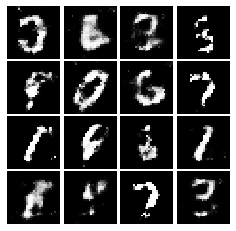

Epoch: 1, Iter: 820, D: 1.262, G:0.7113


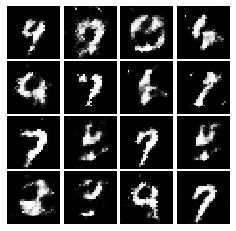

Epoch: 1, Iter: 840, D: 1.255, G:1.049


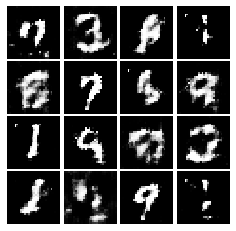

Epoch: 1, Iter: 860, D: 1.288, G:0.9314


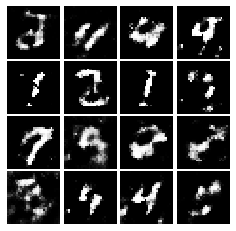

Epoch: 1, Iter: 880, D: 1.386, G:0.9931


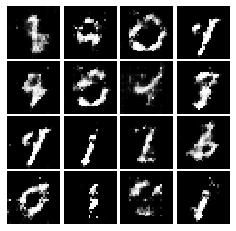

Epoch: 1, Iter: 900, D: 1.495, G:1.23


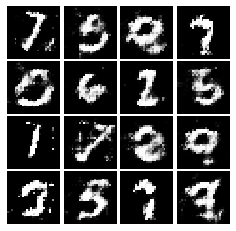

Epoch: 1, Iter: 920, D: 1.489, G:0.6674


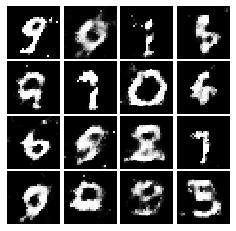

Epoch: 2, Iter: 940, D: 1.277, G:0.9439


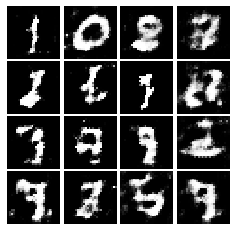

Epoch: 2, Iter: 960, D: 1.229, G:0.8555


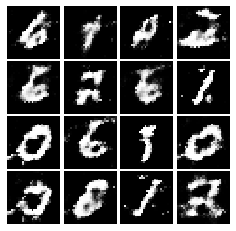

Epoch: 2, Iter: 980, D: 1.357, G:0.8198


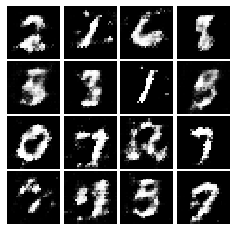

Epoch: 2, Iter: 1000, D: 1.103, G:1.393


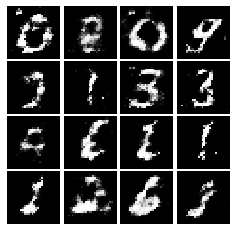

Epoch: 2, Iter: 1020, D: 1.223, G:1.002


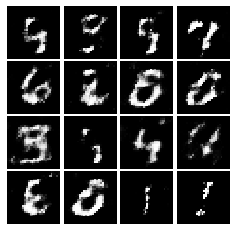

Epoch: 2, Iter: 1040, D: 1.392, G:0.8202


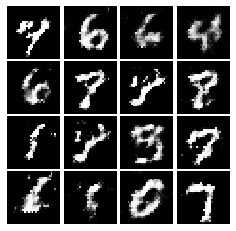

Epoch: 2, Iter: 1060, D: 1.255, G:0.8247


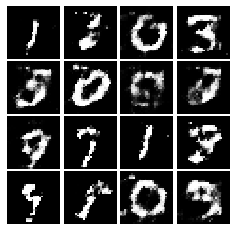

Epoch: 2, Iter: 1080, D: 1.266, G:0.866


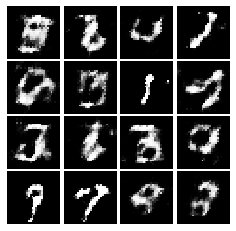

Epoch: 2, Iter: 1100, D: 1.409, G:0.7796


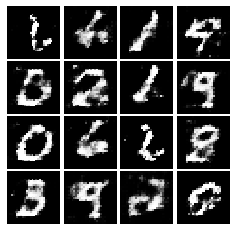

Epoch: 2, Iter: 1120, D: 1.357, G:0.8563


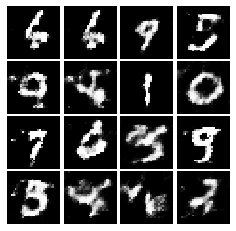

Epoch: 2, Iter: 1140, D: 1.261, G:0.9559


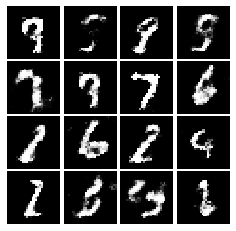

Epoch: 2, Iter: 1160, D: 1.292, G:0.7365


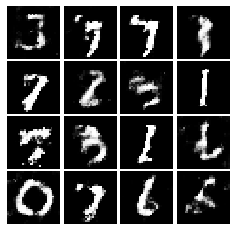

Epoch: 2, Iter: 1180, D: 1.305, G:0.9869


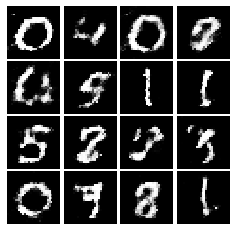

Epoch: 2, Iter: 1200, D: 1.324, G:0.7571


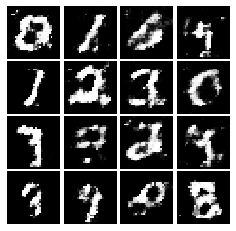

Epoch: 2, Iter: 1220, D: 1.436, G:0.5299


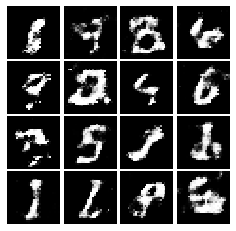

Epoch: 2, Iter: 1240, D: 1.448, G:0.7984


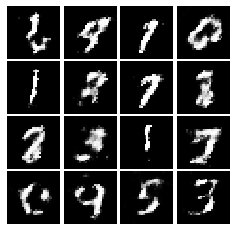

Epoch: 2, Iter: 1260, D: 1.317, G:0.8163


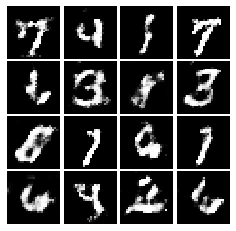

Epoch: 2, Iter: 1280, D: 1.351, G:0.6611


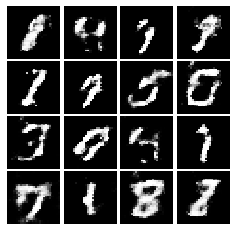

Epoch: 2, Iter: 1300, D: 1.372, G:0.8078


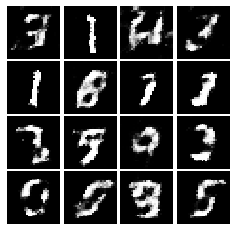

Epoch: 2, Iter: 1320, D: 1.373, G:0.7934


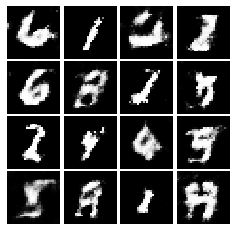

Epoch: 2, Iter: 1340, D: 1.356, G:0.8111


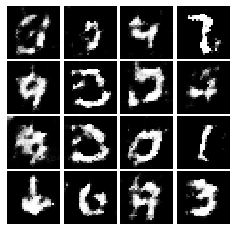

Epoch: 2, Iter: 1360, D: 1.312, G:0.7297


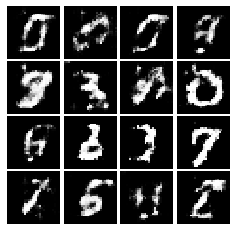

Epoch: 2, Iter: 1380, D: 1.297, G:0.9997


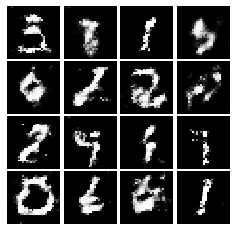

Epoch: 2, Iter: 1400, D: 1.323, G:0.8496


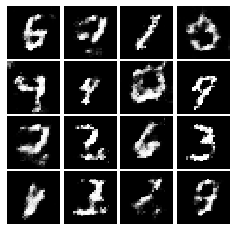

Epoch: 3, Iter: 1420, D: 1.364, G:0.759


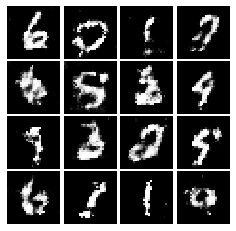

Epoch: 3, Iter: 1440, D: 1.289, G:0.8011


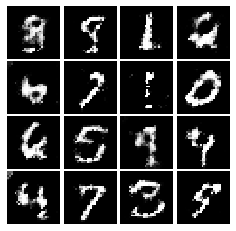

Epoch: 3, Iter: 1460, D: 1.361, G:0.8445


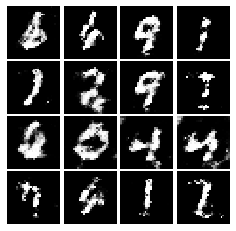

Epoch: 3, Iter: 1480, D: 1.376, G:0.8087


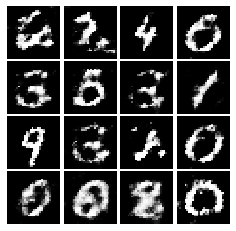

Epoch: 3, Iter: 1500, D: 1.384, G:0.7224


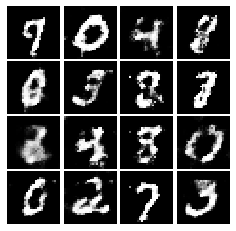

Epoch: 3, Iter: 1520, D: 1.409, G:0.6908


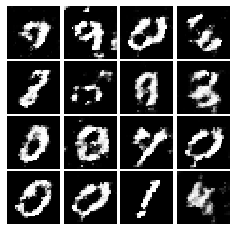

Epoch: 3, Iter: 1540, D: 1.406, G:0.961


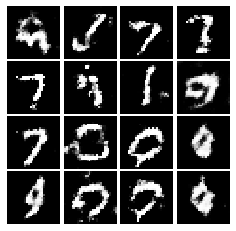

Epoch: 3, Iter: 1560, D: 1.356, G:0.7494


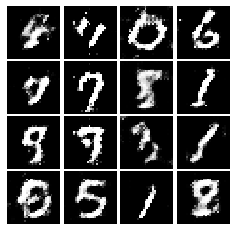

Epoch: 3, Iter: 1580, D: 1.348, G:0.8242


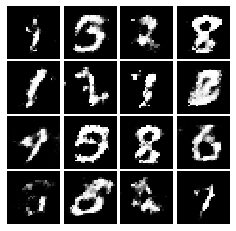

Epoch: 3, Iter: 1600, D: 1.37, G:0.7431


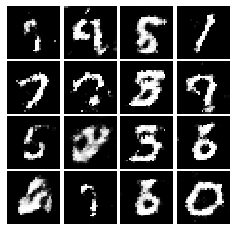

Epoch: 3, Iter: 1620, D: 1.3, G:0.8928


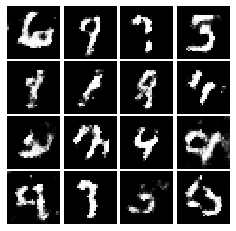

Epoch: 3, Iter: 1640, D: 1.444, G:0.7937


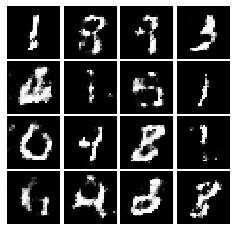

Epoch: 3, Iter: 1660, D: 1.183, G:0.8355


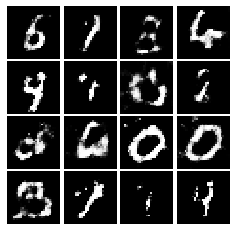

Epoch: 3, Iter: 1680, D: 1.302, G:0.816


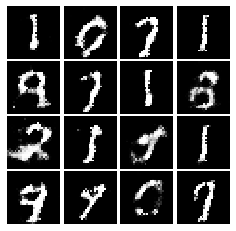

Epoch: 3, Iter: 1700, D: 1.391, G:0.7899


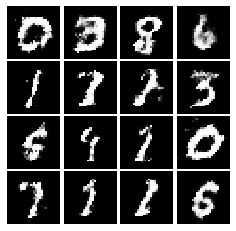

Epoch: 3, Iter: 1720, D: 1.309, G:0.7896


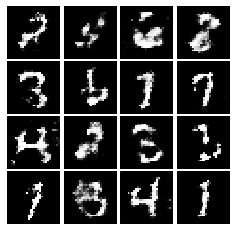

Epoch: 3, Iter: 1740, D: 1.32, G:0.8034


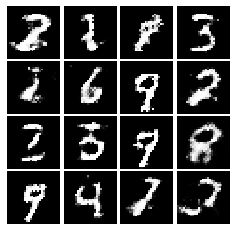

Epoch: 3, Iter: 1760, D: 1.289, G:0.9399


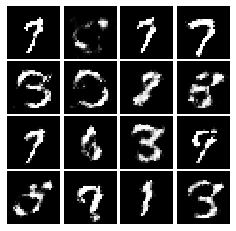

Epoch: 3, Iter: 1780, D: 1.389, G:0.7768


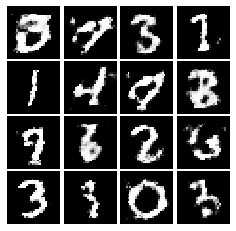

Epoch: 3, Iter: 1800, D: 1.394, G:0.7512


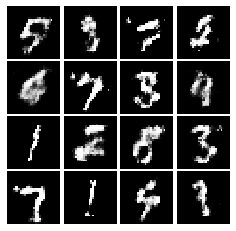

Epoch: 3, Iter: 1820, D: 1.374, G:0.7619


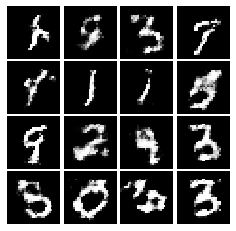

Epoch: 3, Iter: 1840, D: 1.442, G:0.7237


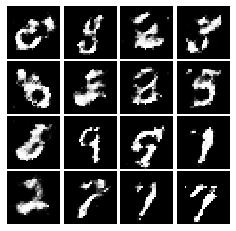

Epoch: 3, Iter: 1860, D: 1.324, G:0.7497


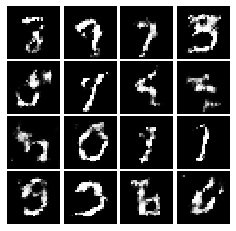

Epoch: 4, Iter: 1880, D: 1.338, G:0.7529


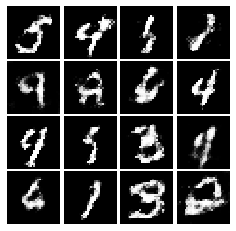

Epoch: 4, Iter: 1900, D: 1.378, G:0.7236


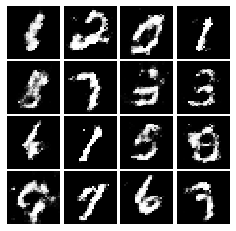

Epoch: 4, Iter: 1920, D: 1.348, G:0.8041


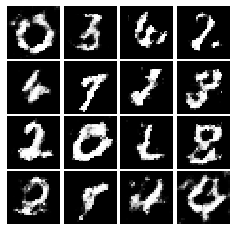

Epoch: 4, Iter: 1940, D: 1.276, G:0.7981


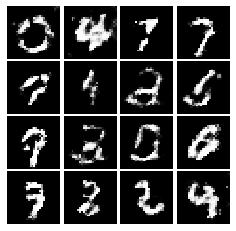

Epoch: 4, Iter: 1960, D: 1.414, G:0.6852


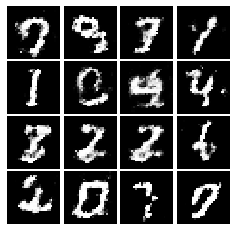

Epoch: 4, Iter: 1980, D: 1.306, G:0.8484


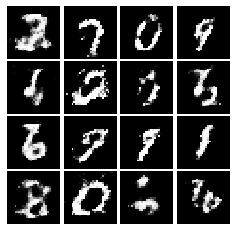

Epoch: 4, Iter: 2000, D: 1.43, G:0.8031


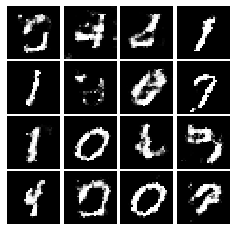

Epoch: 4, Iter: 2020, D: 1.34, G:0.7696


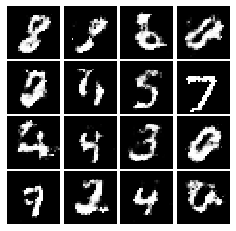

Epoch: 4, Iter: 2040, D: 1.306, G:0.8427


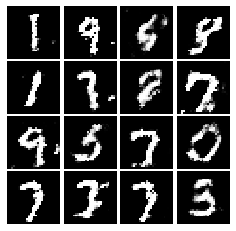

Epoch: 4, Iter: 2060, D: 1.418, G:0.6965


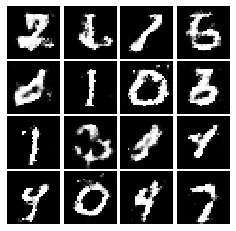

Epoch: 4, Iter: 2080, D: 1.364, G:0.7085


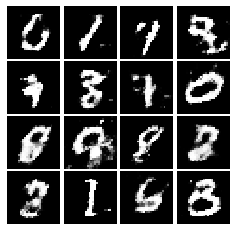

Epoch: 4, Iter: 2100, D: 1.361, G:0.7431


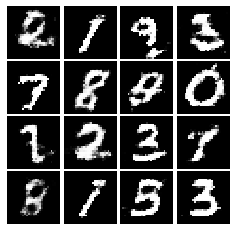

Epoch: 4, Iter: 2120, D: 1.374, G:0.7113


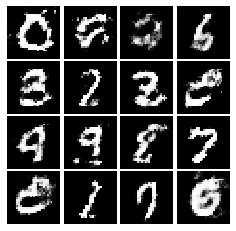

Epoch: 4, Iter: 2140, D: 1.366, G:0.6751


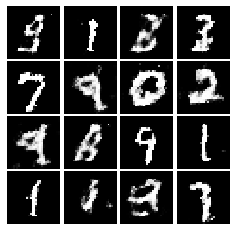

Epoch: 4, Iter: 2160, D: 1.365, G:0.726


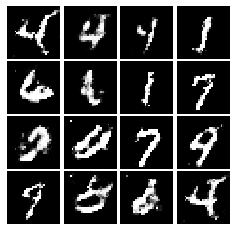

Epoch: 4, Iter: 2180, D: 1.376, G:0.7161


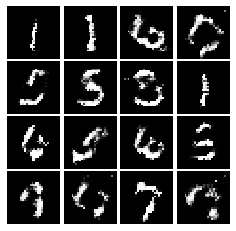

Epoch: 4, Iter: 2200, D: 1.368, G:0.7414


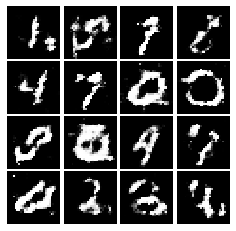

Epoch: 4, Iter: 2220, D: 1.355, G:0.696


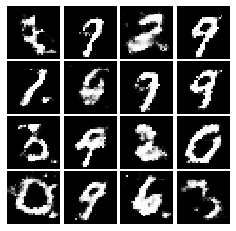

Epoch: 4, Iter: 2240, D: 1.476, G:0.6816


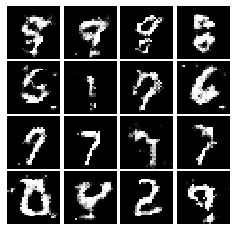

Epoch: 4, Iter: 2260, D: 1.349, G:0.8252


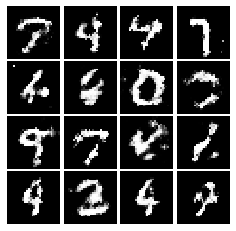

Epoch: 4, Iter: 2280, D: 1.364, G:0.7578


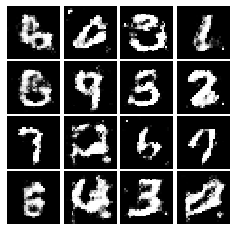

Epoch: 4, Iter: 2300, D: 1.441, G:0.73


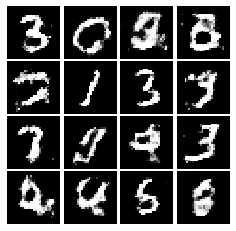

Epoch: 4, Iter: 2320, D: 1.41, G:0.6878


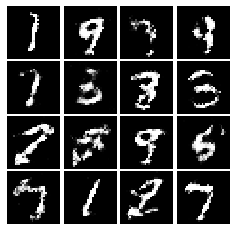

Epoch: 4, Iter: 2340, D: 1.395, G:0.8408


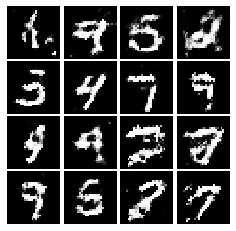

Epoch: 5, Iter: 2360, D: 1.32, G:0.7439


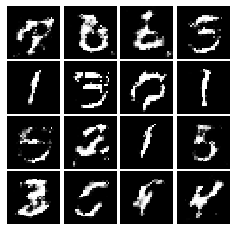

Epoch: 5, Iter: 2380, D: 1.319, G:0.7802


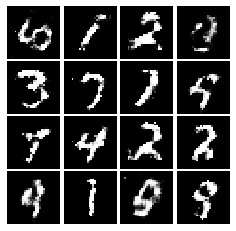

Epoch: 5, Iter: 2400, D: 1.413, G:0.7791


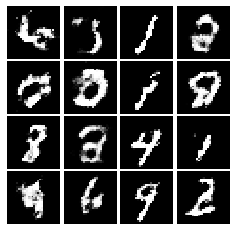

Epoch: 5, Iter: 2420, D: 1.363, G:1.012


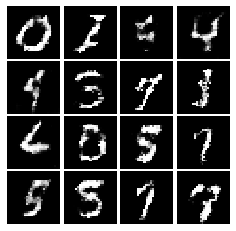

Epoch: 5, Iter: 2440, D: 1.272, G:1.021


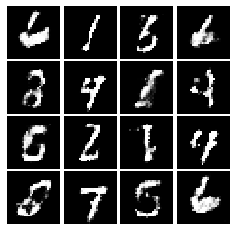

Epoch: 5, Iter: 2460, D: 1.272, G:0.7606


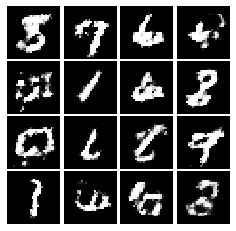

Epoch: 5, Iter: 2480, D: 1.385, G:0.7739


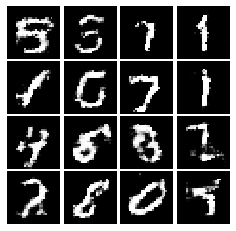

Epoch: 5, Iter: 2500, D: 1.386, G:0.8247


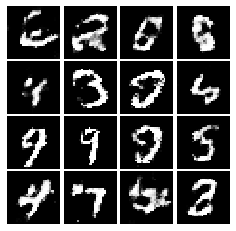

Epoch: 5, Iter: 2520, D: 1.388, G:0.6444


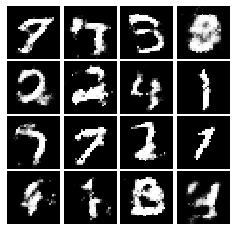

Epoch: 5, Iter: 2540, D: 1.405, G:0.7065


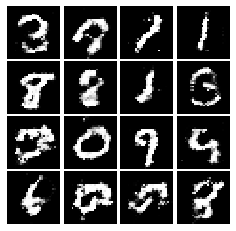

Epoch: 5, Iter: 2560, D: 1.422, G:0.7739


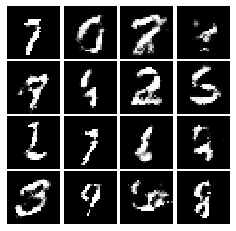

Epoch: 5, Iter: 2580, D: 1.434, G:0.7561


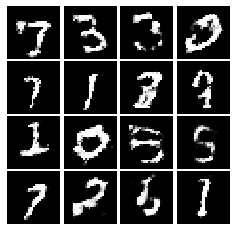

Epoch: 5, Iter: 2600, D: 1.373, G:0.7428


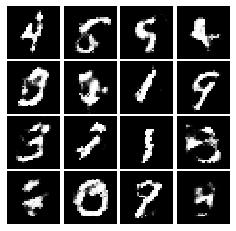

Epoch: 5, Iter: 2620, D: 1.409, G:0.7547


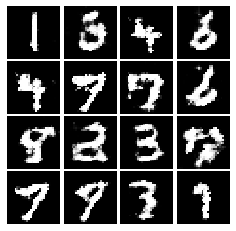

Epoch: 5, Iter: 2640, D: 1.399, G:0.6423


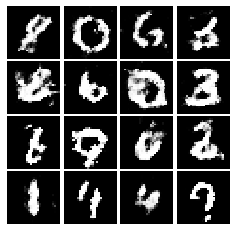

Epoch: 5, Iter: 2660, D: 1.397, G:0.6722


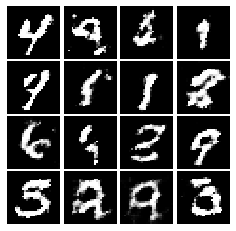

Epoch: 5, Iter: 2680, D: 1.4, G:0.7713


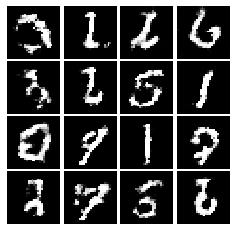

Epoch: 5, Iter: 2700, D: 1.335, G:0.7026


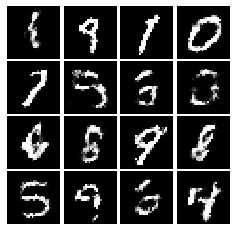

Epoch: 5, Iter: 2720, D: 1.364, G:0.7212


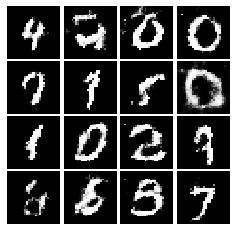

Epoch: 5, Iter: 2740, D: 1.395, G:0.6857


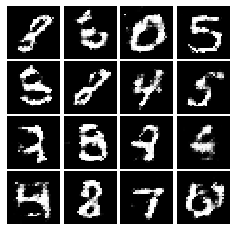

Epoch: 5, Iter: 2760, D: 1.373, G:0.7283


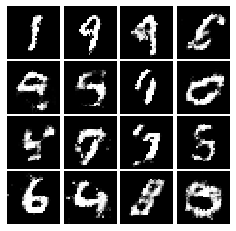

Epoch: 5, Iter: 2780, D: 1.378, G:0.6686


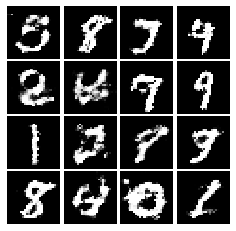

Epoch: 5, Iter: 2800, D: 1.361, G:0.7024


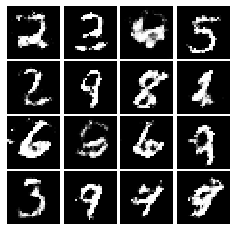

Epoch: 6, Iter: 2820, D: 1.333, G:0.7344


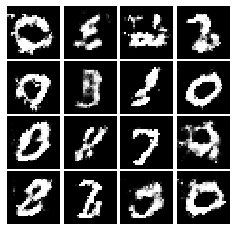

Epoch: 6, Iter: 2840, D: 1.363, G:0.7077


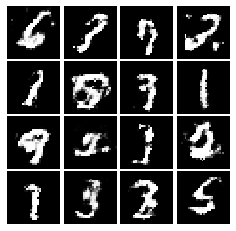

Epoch: 6, Iter: 2860, D: 1.337, G:0.8011


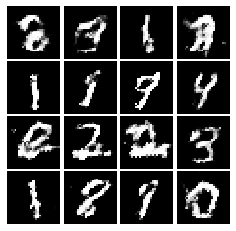

Epoch: 6, Iter: 2880, D: 1.342, G:0.7057


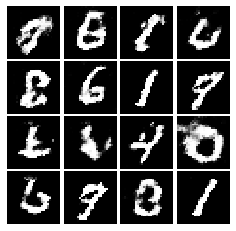

Epoch: 6, Iter: 2900, D: 1.373, G:0.7874


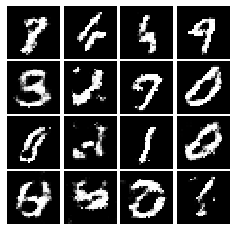

Epoch: 6, Iter: 2920, D: 1.427, G:0.7722


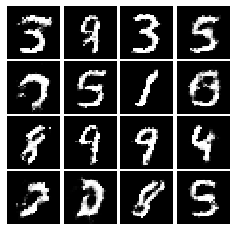

Epoch: 6, Iter: 2940, D: 1.381, G:0.7403


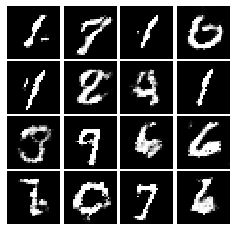

Epoch: 6, Iter: 2960, D: 1.364, G:0.7715


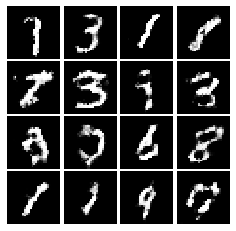

Epoch: 6, Iter: 2980, D: 1.354, G:0.7616


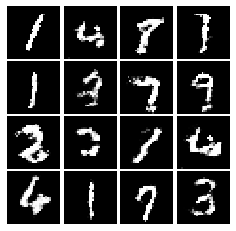

Epoch: 6, Iter: 3000, D: 1.41, G:0.74


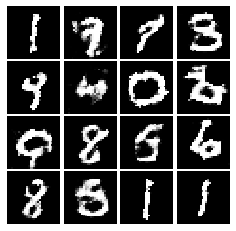

Epoch: 6, Iter: 3020, D: 1.329, G:0.7244


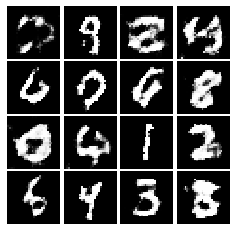

Epoch: 6, Iter: 3040, D: 1.39, G:0.6658


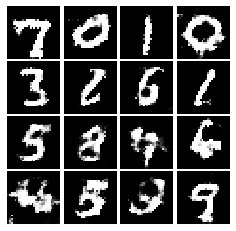

Epoch: 6, Iter: 3060, D: 1.437, G:0.5544


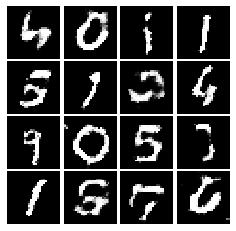

Epoch: 6, Iter: 3080, D: 1.356, G:0.6451


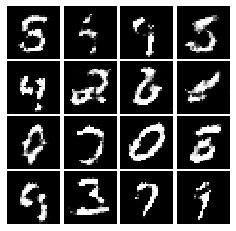

Epoch: 6, Iter: 3100, D: 1.306, G:0.8417


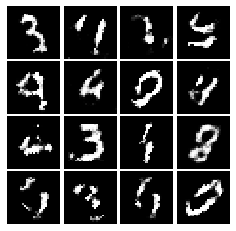

Epoch: 6, Iter: 3120, D: 1.389, G:0.8319


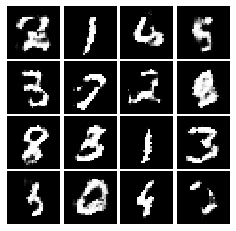

Epoch: 6, Iter: 3140, D: 1.361, G:0.6678


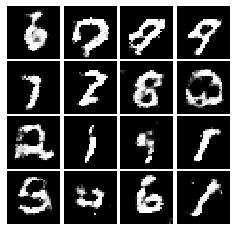

Epoch: 6, Iter: 3160, D: 1.395, G:0.7032


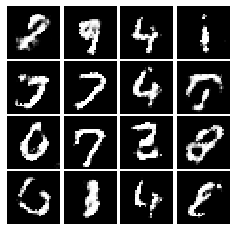

Epoch: 6, Iter: 3180, D: 1.397, G:0.7397


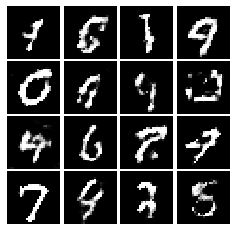

Epoch: 6, Iter: 3200, D: 1.36, G:0.6966


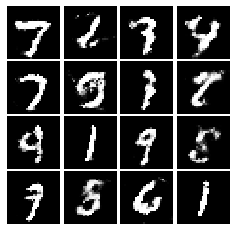

Epoch: 6, Iter: 3220, D: 1.385, G:0.6616


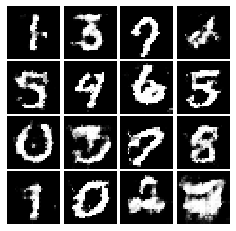

Epoch: 6, Iter: 3240, D: 1.38, G:0.7849


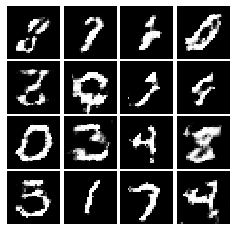

Epoch: 6, Iter: 3260, D: 1.406, G:0.6877


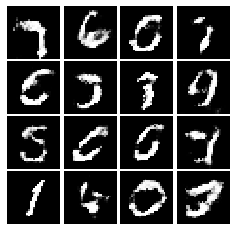

Epoch: 6, Iter: 3280, D: 1.371, G:0.6945


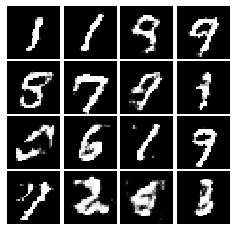

Epoch: 7, Iter: 3300, D: 1.373, G:0.7436


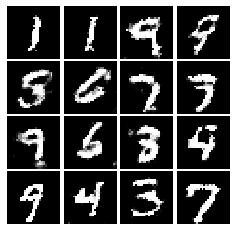

Epoch: 7, Iter: 3320, D: 1.33, G:0.7247


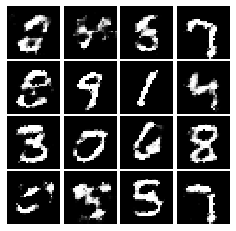

Epoch: 7, Iter: 3340, D: 1.374, G:0.6722


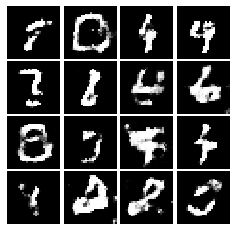

Epoch: 7, Iter: 3360, D: 1.38, G:0.7484


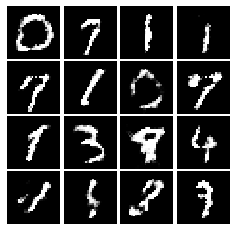

Epoch: 7, Iter: 3380, D: 1.389, G:0.7213


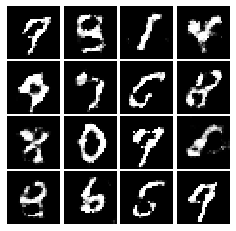

Epoch: 7, Iter: 3400, D: 1.365, G:0.6865


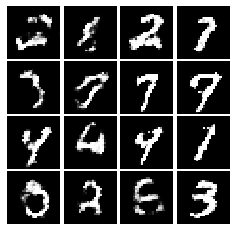

Epoch: 7, Iter: 3420, D: 1.374, G:0.7473


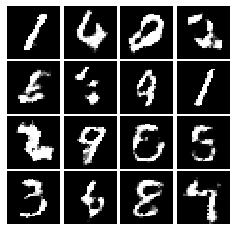

Epoch: 7, Iter: 3440, D: 1.358, G:0.6872


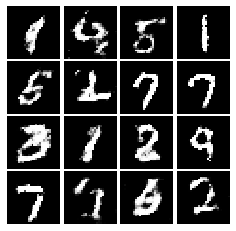

Epoch: 7, Iter: 3460, D: 1.368, G:0.784


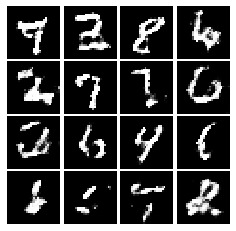

Epoch: 7, Iter: 3480, D: 1.392, G:0.6867


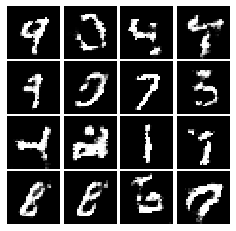

Epoch: 7, Iter: 3500, D: 1.383, G:0.6912


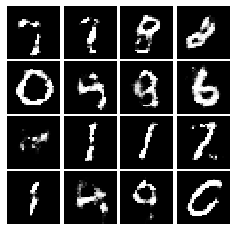

Epoch: 7, Iter: 3520, D: 1.414, G:0.792


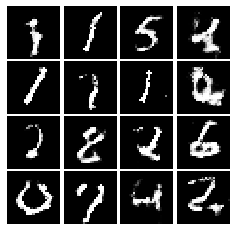

Epoch: 7, Iter: 3540, D: 1.361, G:0.7089


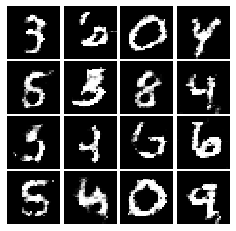

Epoch: 7, Iter: 3560, D: 1.366, G:0.6834


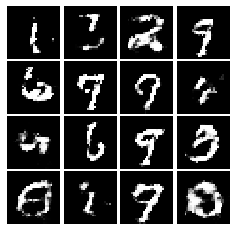

Epoch: 7, Iter: 3580, D: 1.373, G:0.6522


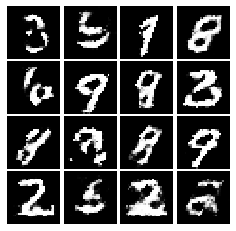

Epoch: 7, Iter: 3600, D: 1.371, G:0.7713


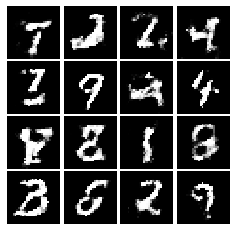

Epoch: 7, Iter: 3620, D: 1.397, G:0.6961


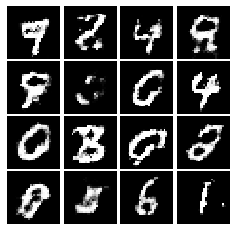

Epoch: 7, Iter: 3640, D: 1.387, G:0.7938


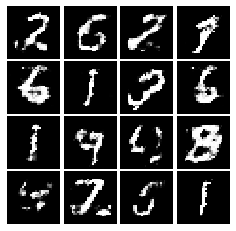

Epoch: 7, Iter: 3660, D: 1.384, G:0.7504


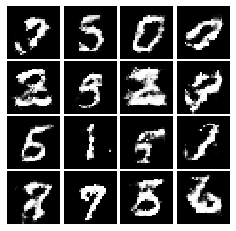

Epoch: 7, Iter: 3680, D: 1.375, G:0.7498


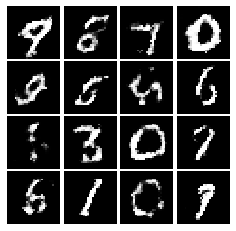

Epoch: 7, Iter: 3700, D: 1.379, G:0.7121


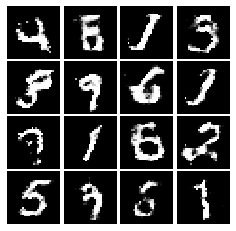

Epoch: 7, Iter: 3720, D: 1.386, G:0.7076


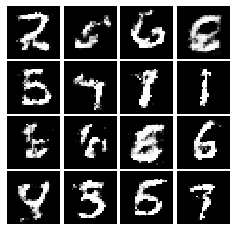

Epoch: 7, Iter: 3740, D: 1.378, G:0.7276


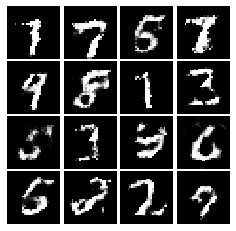

Epoch: 8, Iter: 3760, D: 1.366, G:0.727


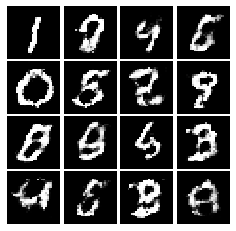

Epoch: 8, Iter: 3780, D: 1.376, G:0.6496


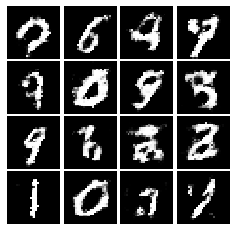

Epoch: 8, Iter: 3800, D: 1.36, G:0.7094


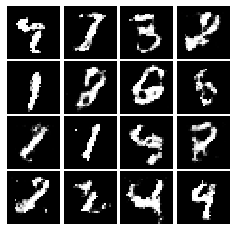

Epoch: 8, Iter: 3820, D: 1.446, G:0.604


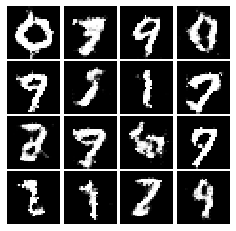

Epoch: 8, Iter: 3840, D: 1.391, G:0.6793


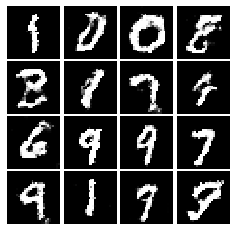

Epoch: 8, Iter: 3860, D: 1.374, G:0.6582


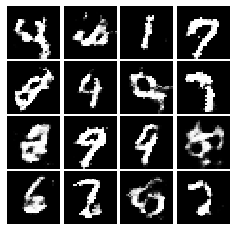

Epoch: 8, Iter: 3880, D: 1.37, G:0.7063


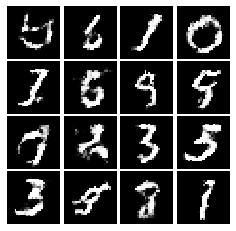

Epoch: 8, Iter: 3900, D: 1.372, G:0.6886


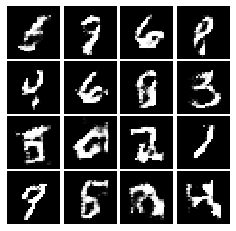

Epoch: 8, Iter: 3920, D: 1.386, G:0.735


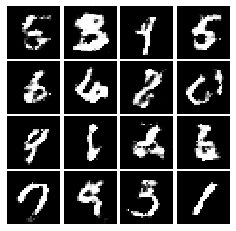

Epoch: 8, Iter: 3940, D: 1.371, G:0.6776


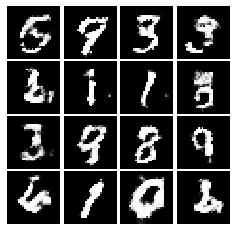

Epoch: 8, Iter: 3960, D: 1.361, G:0.6895


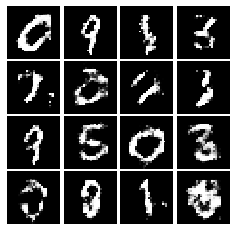

Epoch: 8, Iter: 3980, D: 1.4, G:0.8457


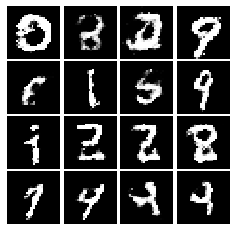

Epoch: 8, Iter: 4000, D: 1.393, G:0.7769


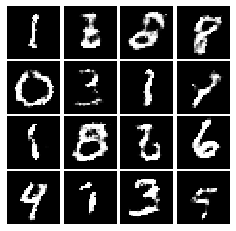

Epoch: 8, Iter: 4020, D: 1.42, G:0.735


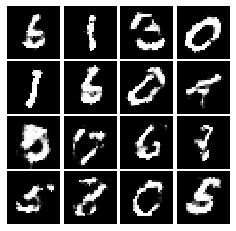

Epoch: 8, Iter: 4040, D: 1.422, G:0.7506


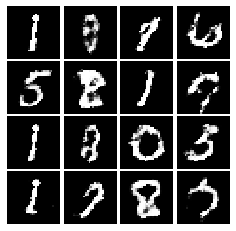

Epoch: 8, Iter: 4060, D: 1.37, G:0.856


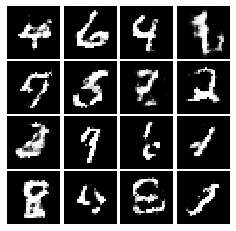

Epoch: 8, Iter: 4080, D: 1.384, G:0.7002


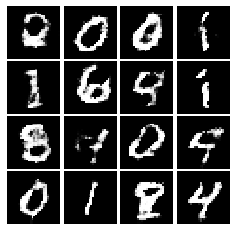

Epoch: 8, Iter: 4100, D: 1.384, G:0.73


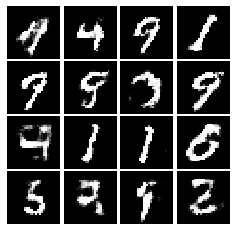

Epoch: 8, Iter: 4120, D: 1.387, G:0.7279


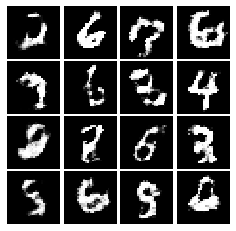

Epoch: 8, Iter: 4140, D: 1.377, G:0.7309


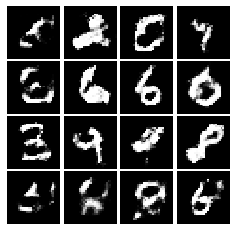

Epoch: 8, Iter: 4160, D: 1.357, G:0.6628


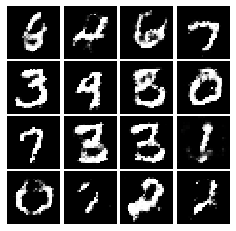

Epoch: 8, Iter: 4180, D: 1.405, G:0.7017


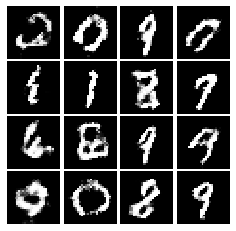

Epoch: 8, Iter: 4200, D: 1.387, G:0.6671


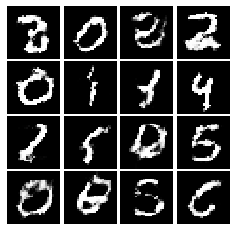

Epoch: 8, Iter: 4220, D: 1.381, G:0.6861


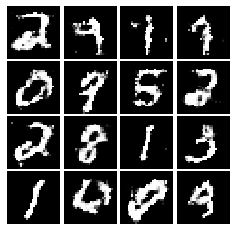

Epoch: 9, Iter: 4240, D: 1.432, G:0.5873


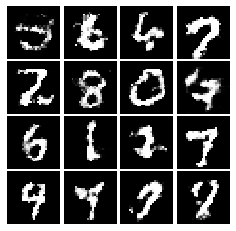

Epoch: 9, Iter: 4260, D: 1.418, G:0.6394


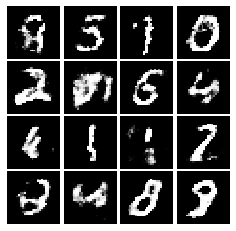

Epoch: 9, Iter: 4280, D: 1.395, G:0.6856


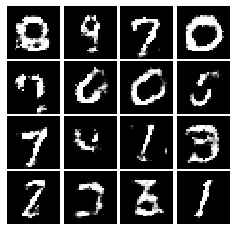

Epoch: 9, Iter: 4300, D: 1.378, G:0.6468


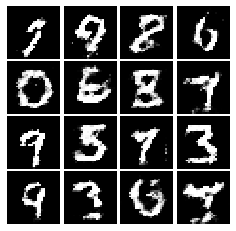

Epoch: 9, Iter: 4320, D: 1.383, G:0.669


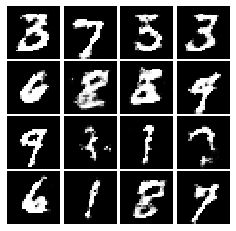

Epoch: 9, Iter: 4340, D: 1.382, G:0.7519


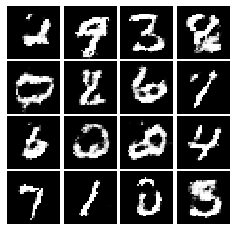

Epoch: 9, Iter: 4360, D: 1.359, G:0.7452


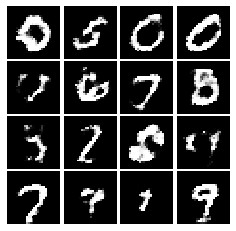

Epoch: 9, Iter: 4380, D: 1.449, G:0.8069


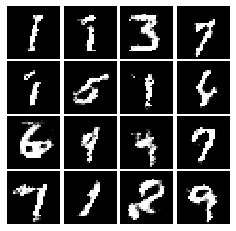

Epoch: 9, Iter: 4400, D: 1.392, G:0.7127


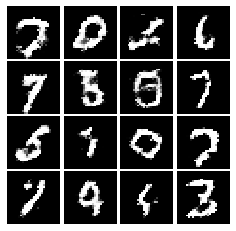

Epoch: 9, Iter: 4420, D: 1.369, G:0.766


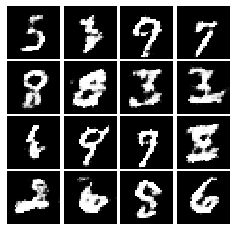

Epoch: 9, Iter: 4440, D: 1.384, G:0.6933


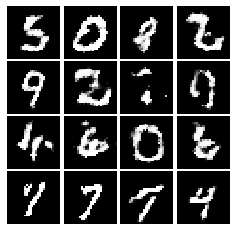

Epoch: 9, Iter: 4460, D: 1.383, G:0.6776


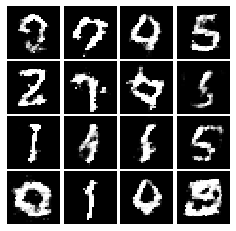

Epoch: 9, Iter: 4480, D: 1.38, G:0.7646


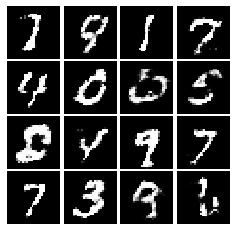

Epoch: 9, Iter: 4500, D: 1.424, G:0.7102


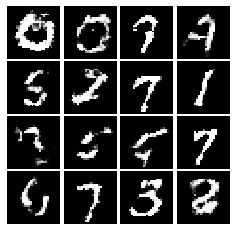

Epoch: 9, Iter: 4520, D: 1.377, G:0.6802


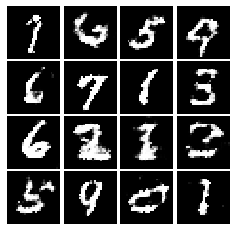

Epoch: 9, Iter: 4540, D: 1.378, G:0.7066


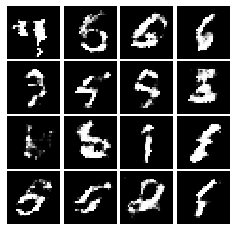

Epoch: 9, Iter: 4560, D: 1.381, G:0.6937


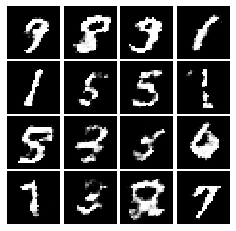

Epoch: 9, Iter: 4580, D: 1.393, G:0.678


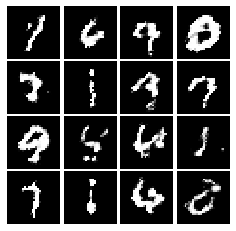

Epoch: 9, Iter: 4600, D: 1.395, G:0.7243


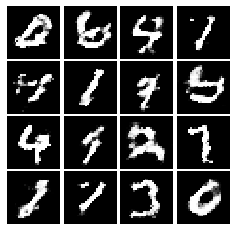

Epoch: 9, Iter: 4620, D: 1.37, G:0.8357


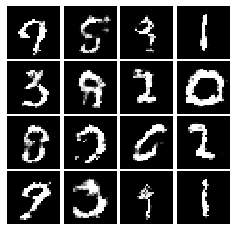

Epoch: 9, Iter: 4640, D: 1.383, G:0.6864


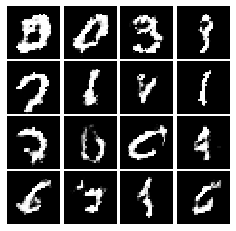

Epoch: 9, Iter: 4660, D: 1.395, G:0.6558


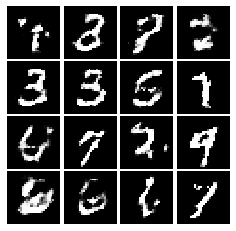

Epoch: 9, Iter: 4680, D: 1.376, G:0.7326


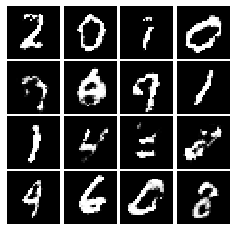

Final images


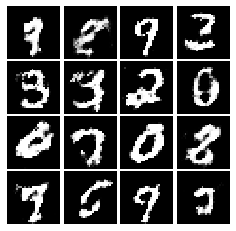

In [97]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss)

# Least Squares GAN
We'll now look at [Least Squares GAN](https://arxiv.org/abs/1611.04076), a newer, more stable alternative to the original GAN loss function. For this part, all we have to do is change the loss function and retrain the model. We'll implement equation (9) in the paper, with the generator loss:
$$\ell_G  =  \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[\left(D(G(z))-1\right)^2\right]$$
and the discriminator loss:
$$ \ell_D = \frac{1}{2}\mathbb{E}_{x \sim p_\text{data}}\left[\left(D(x)-1\right)^2\right] + \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[ \left(D(G(z))\right)^2\right]$$


**HINTS**: Instead of computing the expectation, we will be averaging over elements of the minibatch, so make sure to combine the loss by averaging instead of summing. When plugging in for $D(x)$ and $D(G(z))$ use the direct output from the discriminator (`score_real` and `score_fake`).

In [0]:
def ls_discriminator_loss(scores_real, scores_fake):
    """
    Compute the Least-Squares GAN loss for the discriminator.
    
    Inputs:
    - scores_real: Tensor of shape (N, 1) giving scores for the real data.
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    D_loss = None

    one_fake=tf.ones_like(scores_fake)
    one_real=tf.ones_like(scores_real)
    
    #G_loss=tf.Print(D_loss,[D_loss],message="D_loss")
    D_loss=(tf.reduce_mean(tf.square(scores_fake))+tf.reduce_mean(tf.square(scores_real-one_real)))*0.5
    loss=D_loss
    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def ls_generator_loss(scores_fake):
    """
    Computes the Least-Squares GAN loss for the generator.
    
    Inputs:
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    one_fake=tf.ones_like(scores_fake)
    G_loss=tf.reduce_mean(tf.square(scores_fake-one_fake))*0.5
    loss=G_loss
    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your LSGAN loss. You should see errors less than 1e-8.

In [0]:
def test_lsgan_loss(score_real, score_fake, d_loss_true, g_loss_true):
    
    d_loss = ls_discriminator_loss(tf.constant(score_real), tf.constant(score_fake))
    g_loss = ls_generator_loss(tf.constant(score_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_lsgan_loss(answers['logits_real'], answers['logits_fake'],
                answers['d_loss_lsgan_true'], answers['g_loss_lsgan_true'])

Maximum error in d_loss: 0
Maximum error in g_loss: 0


Create new training steps so we instead minimize the LSGAN loss:

Epoch: 0, Iter: 0, D: 0.5175, G:0.3608


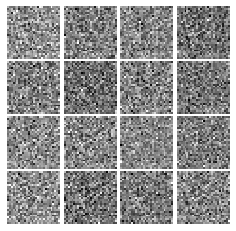

Epoch: 0, Iter: 20, D: 0.1466, G:1.952


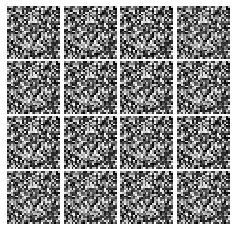

Epoch: 0, Iter: 40, D: 0.01342, G:0.6059


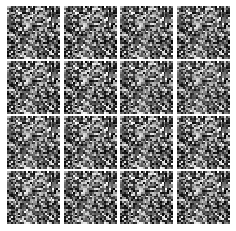

Epoch: 0, Iter: 60, D: 0.01124, G:0.7138


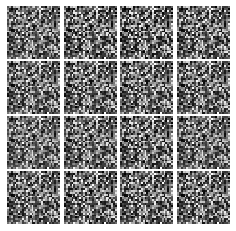

Epoch: 0, Iter: 80, D: 0.009883, G:0.5469


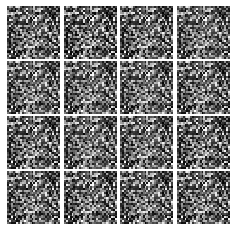

Epoch: 0, Iter: 100, D: 0.005507, G:0.5909


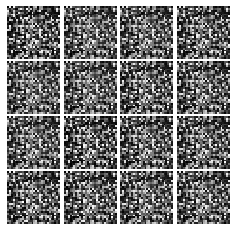

Epoch: 0, Iter: 120, D: 0.09931, G:0.78


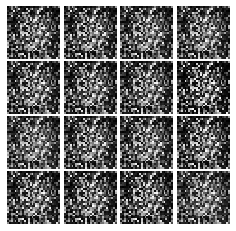

Epoch: 0, Iter: 140, D: 0.09183, G:0.99


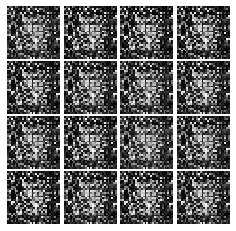

Epoch: 0, Iter: 160, D: 0.06367, G:0.6658


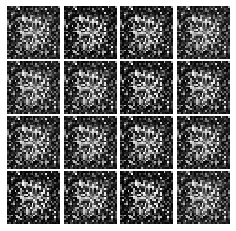

Epoch: 0, Iter: 180, D: 0.1043, G:0.8444


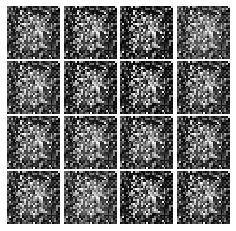

Epoch: 0, Iter: 200, D: 0.1309, G:0.4032


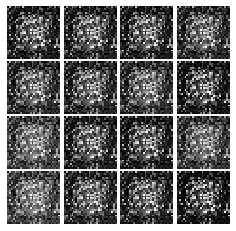

Epoch: 0, Iter: 220, D: 0.1697, G:0.5934


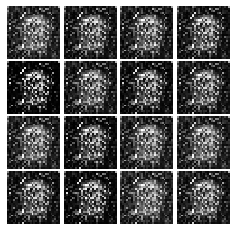

Epoch: 0, Iter: 240, D: 0.07357, G:0.5031


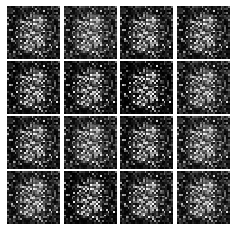

Epoch: 0, Iter: 260, D: 0.1989, G:0.1952


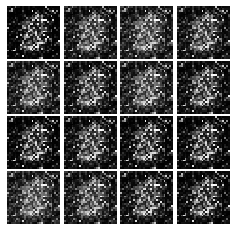

Epoch: 0, Iter: 280, D: 0.345, G:0.2064


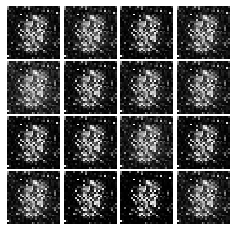

Epoch: 0, Iter: 300, D: 0.1326, G:0.673


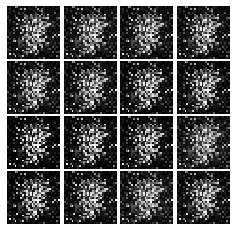

Epoch: 0, Iter: 320, D: 0.0691, G:0.6204


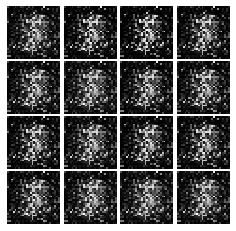

Epoch: 0, Iter: 340, D: 0.1834, G:1.324


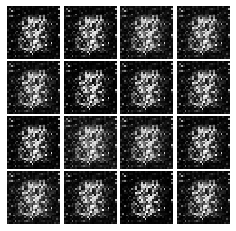

Epoch: 0, Iter: 360, D: 0.4882, G:0.492


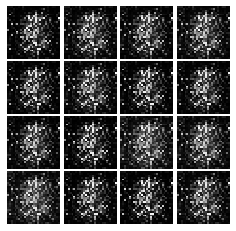

Epoch: 0, Iter: 380, D: 0.154, G:0.4652


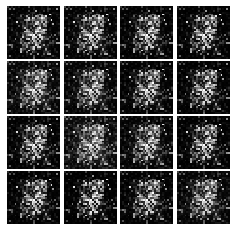

Epoch: 0, Iter: 400, D: 0.1124, G:0.3232


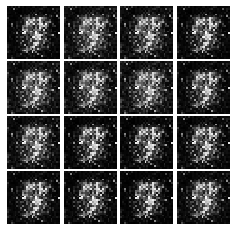

Epoch: 0, Iter: 420, D: 0.0683, G:0.3515


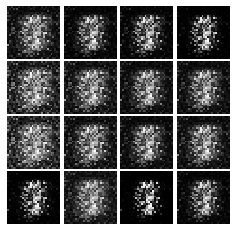

Epoch: 0, Iter: 440, D: 0.1024, G:0.5901


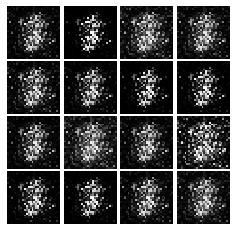

Epoch: 0, Iter: 460, D: 0.207, G:0.4347


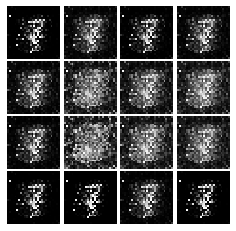

Epoch: 1, Iter: 480, D: 0.1871, G:0.3143


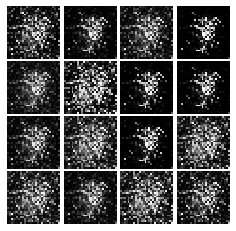

Epoch: 1, Iter: 500, D: 0.1526, G:0.4022


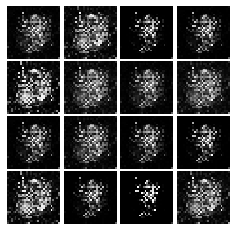

Epoch: 1, Iter: 520, D: 0.1259, G:0.4421


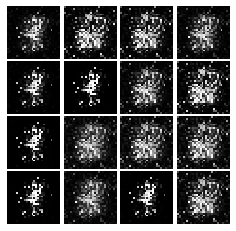

Epoch: 1, Iter: 540, D: 0.1016, G:0.4338


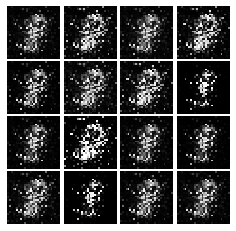

Epoch: 1, Iter: 560, D: 0.07028, G:0.5001


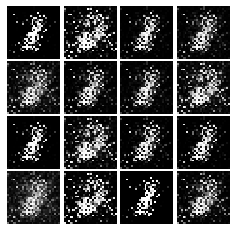

Epoch: 1, Iter: 580, D: 0.08108, G:0.447


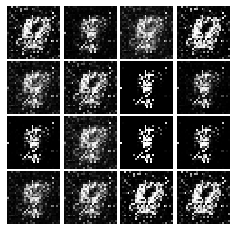

Epoch: 1, Iter: 600, D: 0.1488, G:0.3374


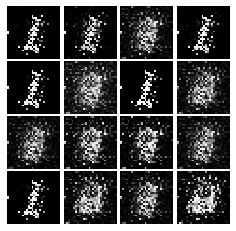

Epoch: 1, Iter: 620, D: 0.3874, G:0.529


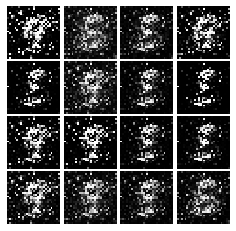

Epoch: 1, Iter: 640, D: 0.1205, G:0.4301


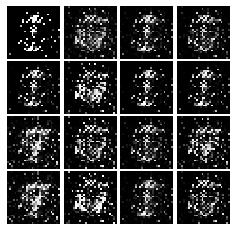

Epoch: 1, Iter: 660, D: 0.1539, G:0.5727


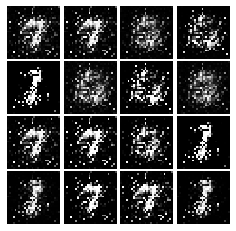

Epoch: 1, Iter: 680, D: 0.4312, G:0.9138


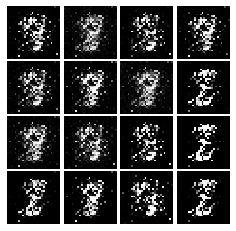

Epoch: 1, Iter: 700, D: 0.08943, G:0.5316


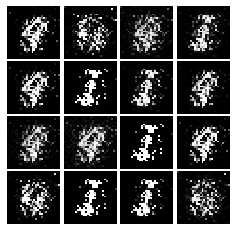

Epoch: 1, Iter: 720, D: 0.1125, G:0.3876


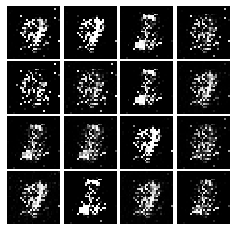

Epoch: 1, Iter: 740, D: 0.1046, G:0.6827


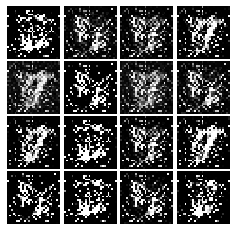

Epoch: 1, Iter: 760, D: 0.4833, G:0.04551


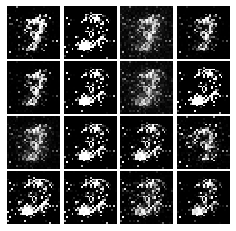

Epoch: 1, Iter: 780, D: 0.1035, G:0.6891


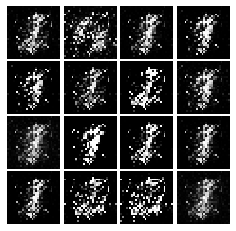

Epoch: 1, Iter: 800, D: 0.1287, G:0.4351


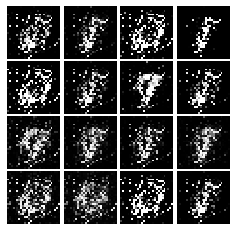

Epoch: 1, Iter: 820, D: 0.1162, G:0.409


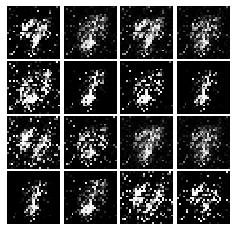

Epoch: 1, Iter: 840, D: 0.1193, G:0.3233


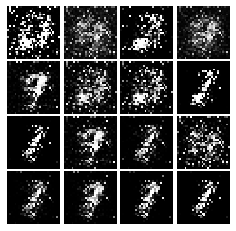

Epoch: 1, Iter: 860, D: 0.09405, G:0.3329


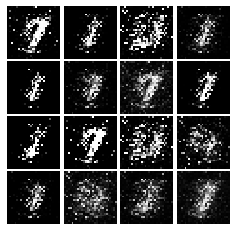

Epoch: 1, Iter: 880, D: 0.2871, G:0.03456


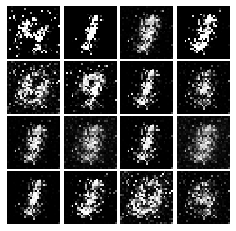

Epoch: 1, Iter: 900, D: 0.1596, G:0.3876


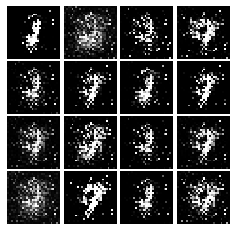

Epoch: 1, Iter: 920, D: 0.06873, G:0.5715


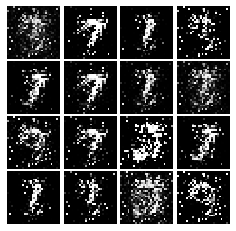

Epoch: 2, Iter: 940, D: 0.1342, G:0.4223


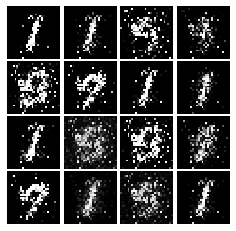

Epoch: 2, Iter: 960, D: 0.1102, G:0.4145


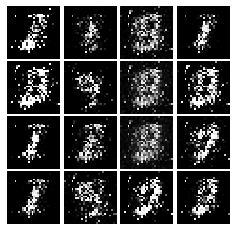

Epoch: 2, Iter: 980, D: 0.1551, G:0.2218


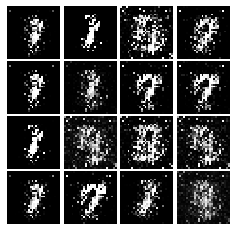

Epoch: 2, Iter: 1000, D: 0.1017, G:0.4375


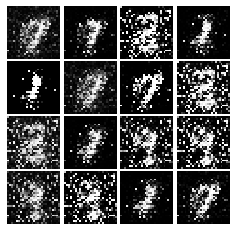

Epoch: 2, Iter: 1020, D: 0.1276, G:0.3093


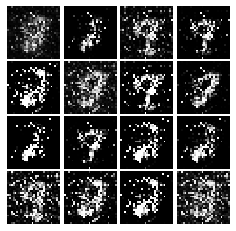

Epoch: 2, Iter: 1040, D: 0.06818, G:0.3655


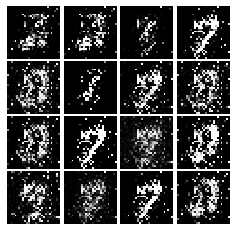

Epoch: 2, Iter: 1060, D: 0.1148, G:0.314


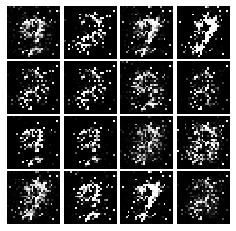

Epoch: 2, Iter: 1080, D: 0.13, G:0.2814


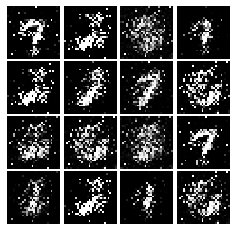

Epoch: 2, Iter: 1100, D: 0.1594, G:0.2323


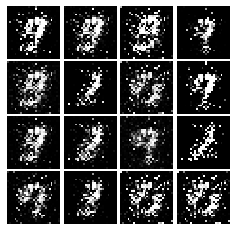

Epoch: 2, Iter: 1120, D: 0.2052, G:0.3852


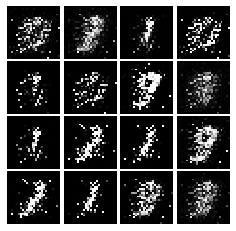

Epoch: 2, Iter: 1140, D: 0.1646, G:0.3885


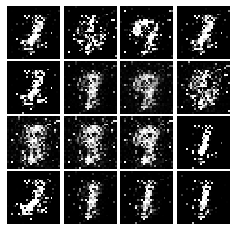

Epoch: 2, Iter: 1160, D: 0.119, G:0.3545


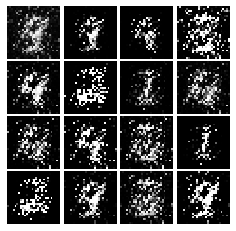

Epoch: 2, Iter: 1180, D: 0.118, G:0.0273


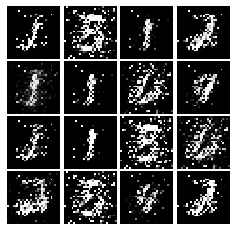

Epoch: 2, Iter: 1200, D: 0.1776, G:0.3012


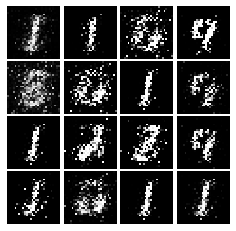

Epoch: 2, Iter: 1220, D: 0.1147, G:0.4387


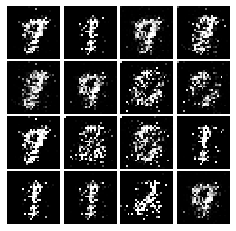

Epoch: 2, Iter: 1240, D: 0.1657, G:0.2669


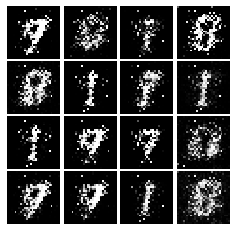

Epoch: 2, Iter: 1260, D: 0.161, G:0.3097


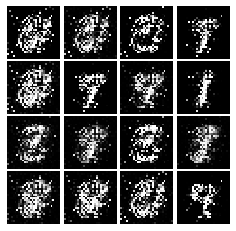

Epoch: 2, Iter: 1280, D: 0.3105, G:0.1465


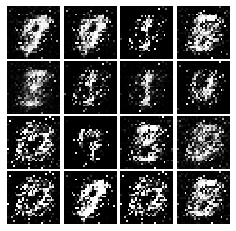

Epoch: 2, Iter: 1300, D: 0.1603, G:0.4034


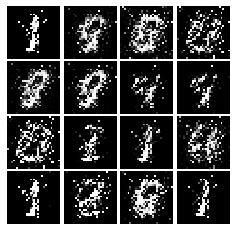

Epoch: 2, Iter: 1320, D: 0.1714, G:0.2494


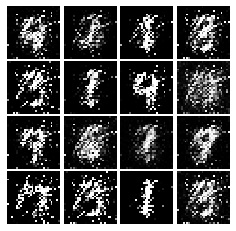

Epoch: 2, Iter: 1340, D: 0.2073, G:0.2314


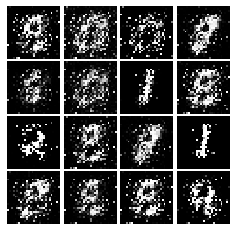

Epoch: 2, Iter: 1360, D: 0.1902, G:0.3595


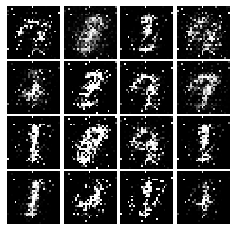

Epoch: 2, Iter: 1380, D: 0.1935, G:0.3922


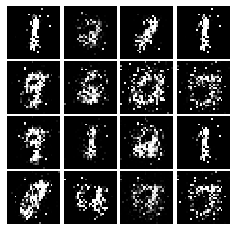

Epoch: 2, Iter: 1400, D: 0.1763, G:0.218


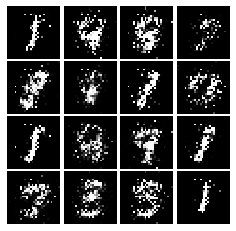

Epoch: 3, Iter: 1420, D: 0.198, G:0.2105


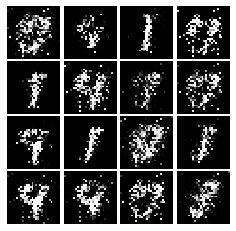

Epoch: 3, Iter: 1440, D: 0.1763, G:0.2118


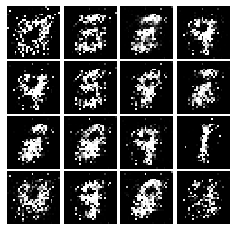

Epoch: 3, Iter: 1460, D: 0.2113, G:0.2048


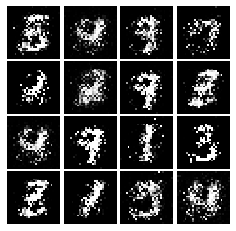

Epoch: 3, Iter: 1480, D: 0.241, G:0.1714


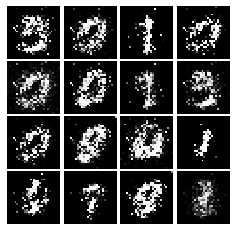

Epoch: 3, Iter: 1500, D: 0.1261, G:0.385


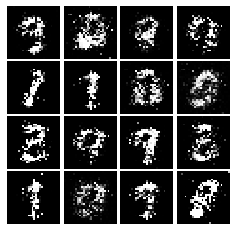

Epoch: 3, Iter: 1520, D: 0.2107, G:0.1631


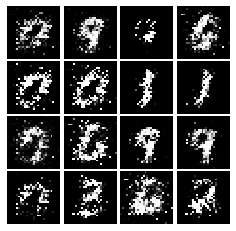

Epoch: 3, Iter: 1540, D: 0.2031, G:0.2081


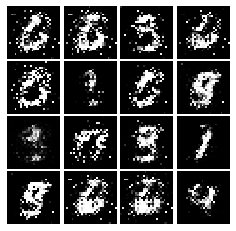

Epoch: 3, Iter: 1560, D: 0.1765, G:0.2504


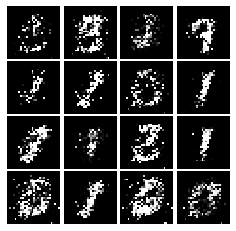

Epoch: 3, Iter: 1580, D: 0.226, G:0.3384


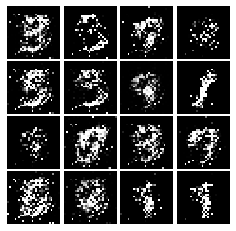

Epoch: 3, Iter: 1600, D: 0.1949, G:0.2497


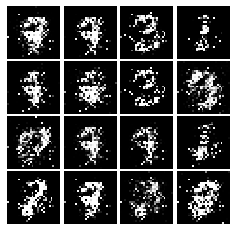

Epoch: 3, Iter: 1620, D: 0.1722, G:0.2522


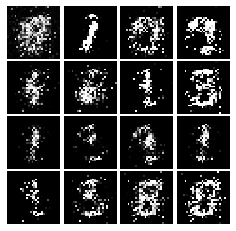

Epoch: 3, Iter: 1640, D: 0.1962, G:0.2866


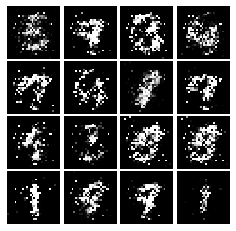

Epoch: 3, Iter: 1660, D: 0.1532, G:0.3072


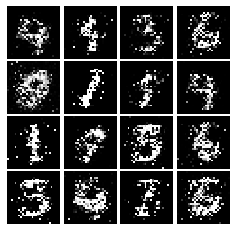

Epoch: 3, Iter: 1680, D: 0.1645, G:0.2326


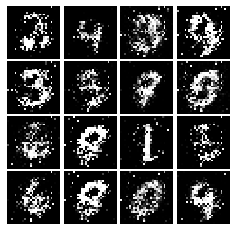

Epoch: 3, Iter: 1700, D: 0.198, G:0.2073


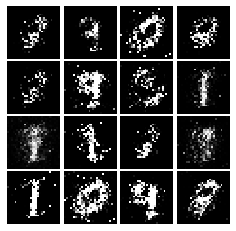

Epoch: 3, Iter: 1720, D: 0.2252, G:0.4644


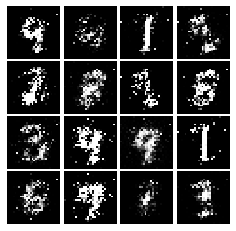

Epoch: 3, Iter: 1740, D: 0.1635, G:0.2116


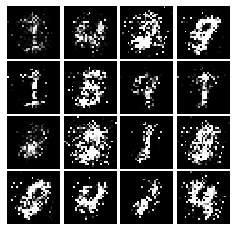

Epoch: 3, Iter: 1760, D: 0.2191, G:0.2432


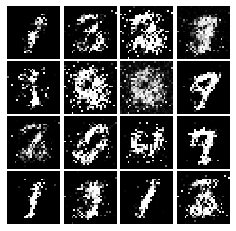

Epoch: 3, Iter: 1780, D: 0.165, G:0.2395


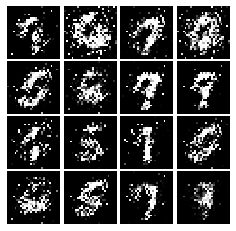

Epoch: 3, Iter: 1800, D: 0.1967, G:0.2554


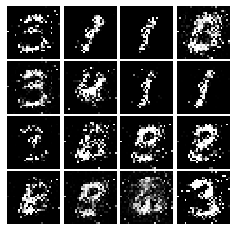

Epoch: 3, Iter: 1820, D: 0.215, G:0.2266


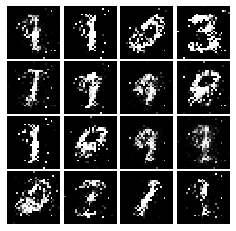

Epoch: 3, Iter: 1840, D: 0.1883, G:1.011


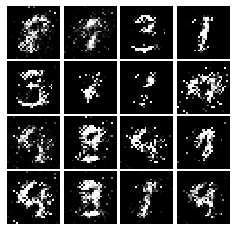

Epoch: 3, Iter: 1860, D: 0.23, G:0.3481


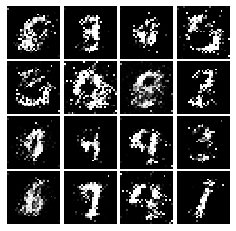

Epoch: 4, Iter: 1880, D: 0.1823, G:0.2109


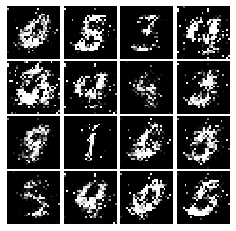

Epoch: 4, Iter: 1900, D: 0.1845, G:0.2495


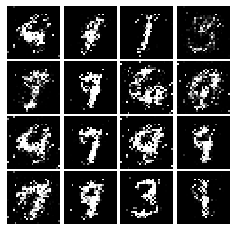

Epoch: 4, Iter: 1920, D: 0.1819, G:0.2202


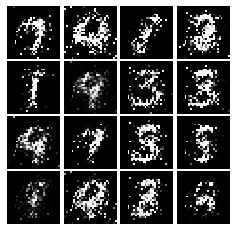

Epoch: 4, Iter: 1940, D: 0.1956, G:0.2053


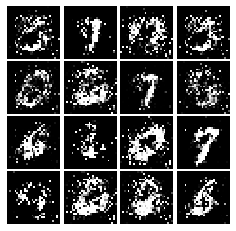

Epoch: 4, Iter: 1960, D: 0.1605, G:0.5237


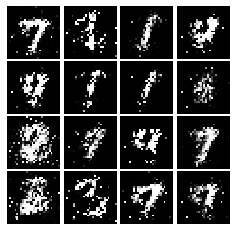

Epoch: 4, Iter: 1980, D: 0.1812, G:0.277


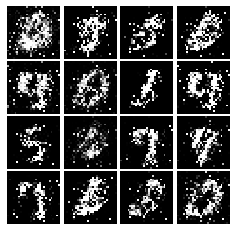

Epoch: 4, Iter: 2000, D: 0.1916, G:0.1835


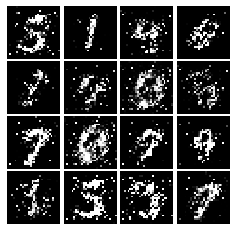

Epoch: 4, Iter: 2020, D: 0.1937, G:0.2366


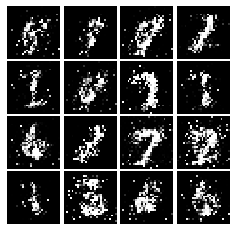

Epoch: 4, Iter: 2040, D: 0.2093, G:0.2133


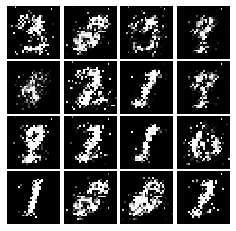

Epoch: 4, Iter: 2060, D: 0.2292, G:0.2172


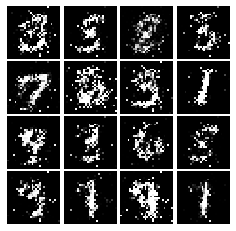

Epoch: 4, Iter: 2080, D: 0.1877, G:0.2477


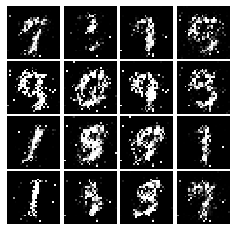

Epoch: 4, Iter: 2100, D: 0.1979, G:0.2031


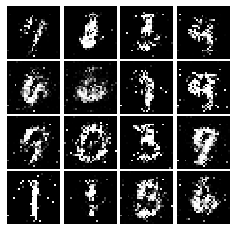

Epoch: 4, Iter: 2120, D: 0.2197, G:0.3811


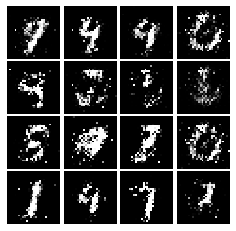

Epoch: 4, Iter: 2140, D: 0.1963, G:0.1966


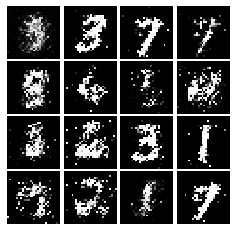

Epoch: 4, Iter: 2160, D: 0.2264, G:0.1844


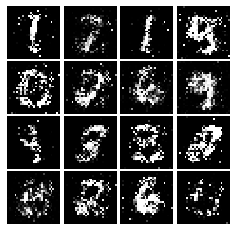

Epoch: 4, Iter: 2180, D: 0.2038, G:0.1979


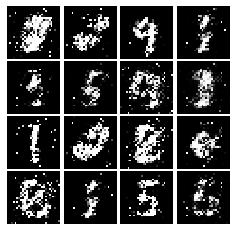

Epoch: 4, Iter: 2200, D: 0.1894, G:0.237


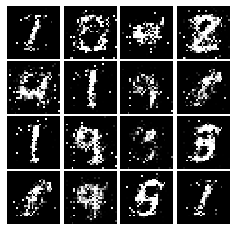

Epoch: 4, Iter: 2220, D: 0.2117, G:0.2282


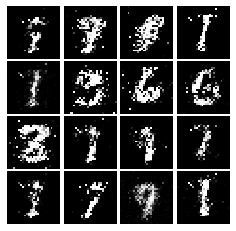

Epoch: 4, Iter: 2240, D: 0.2172, G:0.1838


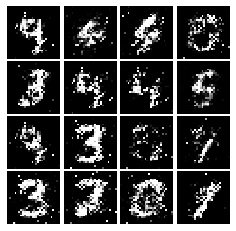

Epoch: 4, Iter: 2260, D: 0.1997, G:0.1998


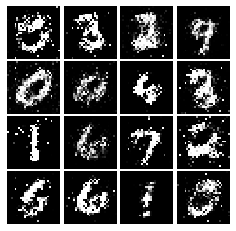

Epoch: 4, Iter: 2280, D: 0.2187, G:0.2122


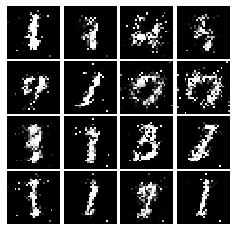

Epoch: 4, Iter: 2300, D: 0.2371, G:0.2278


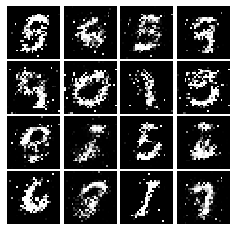

Epoch: 4, Iter: 2320, D: 0.215, G:0.1677


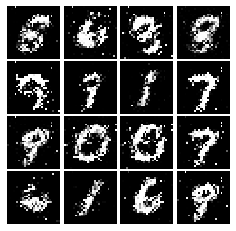

Epoch: 4, Iter: 2340, D: 0.2099, G:0.2525


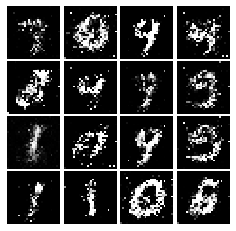

Epoch: 5, Iter: 2360, D: 0.2195, G:0.2087


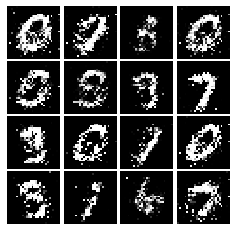

Epoch: 5, Iter: 2380, D: 0.2112, G:0.1854


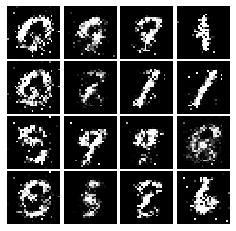

Epoch: 5, Iter: 2400, D: 0.2047, G:0.1946


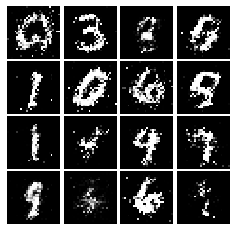

Epoch: 5, Iter: 2420, D: 0.2076, G:0.1724


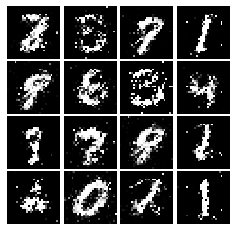

Epoch: 5, Iter: 2440, D: 0.2488, G:0.1821


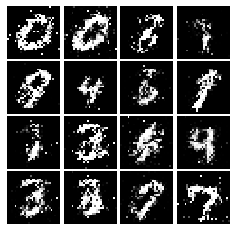

Epoch: 5, Iter: 2460, D: 0.2042, G:0.1911


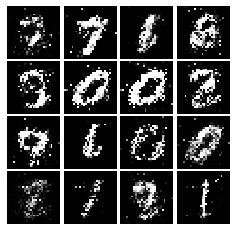

Epoch: 5, Iter: 2480, D: 0.1987, G:0.09114


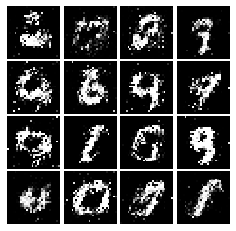

Epoch: 5, Iter: 2500, D: 0.2156, G:0.1942


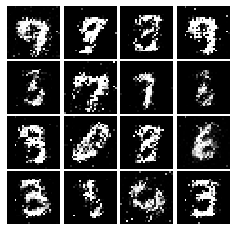

Epoch: 5, Iter: 2520, D: 0.2346, G:0.1717


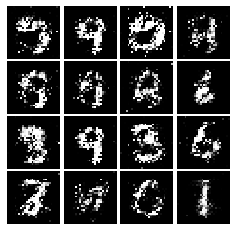

Epoch: 5, Iter: 2540, D: 0.2462, G:0.1627


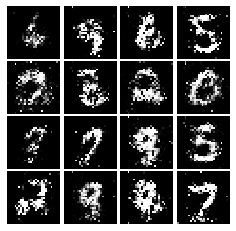

Epoch: 5, Iter: 2560, D: 0.2293, G:0.2202


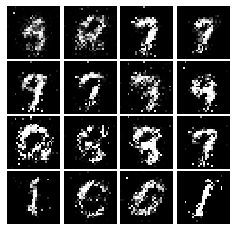

Epoch: 5, Iter: 2580, D: 0.228, G:0.211


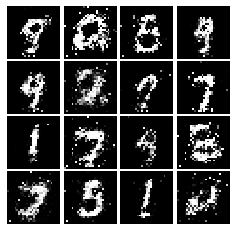

Epoch: 5, Iter: 2600, D: 0.2389, G:0.1666


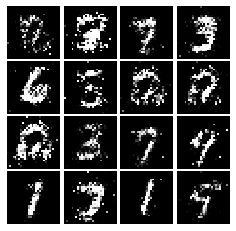

Epoch: 5, Iter: 2620, D: 0.2231, G:0.2268


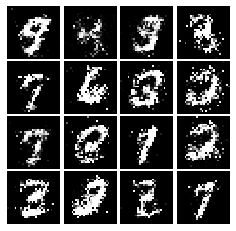

Epoch: 5, Iter: 2640, D: 0.2146, G:0.1851


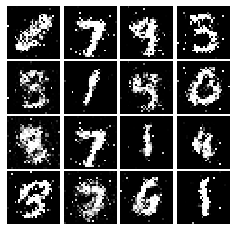

Epoch: 5, Iter: 2660, D: 0.2072, G:0.2378


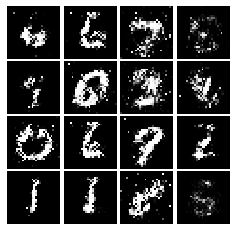

Epoch: 5, Iter: 2680, D: 0.2344, G:0.1699


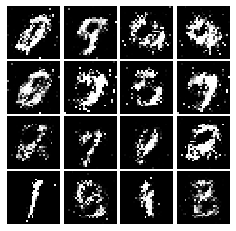

Epoch: 5, Iter: 2700, D: 0.2312, G:0.1839


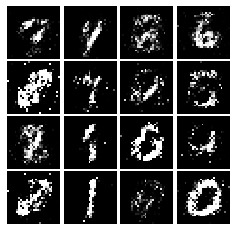

Epoch: 5, Iter: 2720, D: 0.2182, G:0.1882


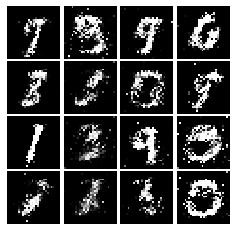

Epoch: 5, Iter: 2740, D: 0.2289, G:0.1594


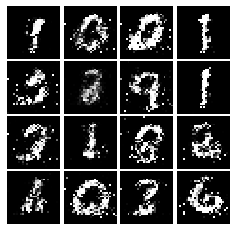

Epoch: 5, Iter: 2760, D: 0.2587, G:0.1865


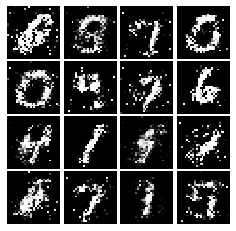

Epoch: 5, Iter: 2780, D: 0.2328, G:0.1634


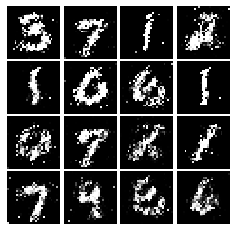

Epoch: 5, Iter: 2800, D: 0.2161, G:0.183


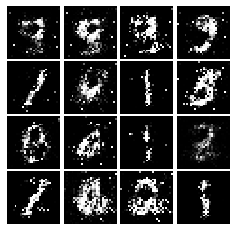

Epoch: 6, Iter: 2820, D: 0.2294, G:0.1711


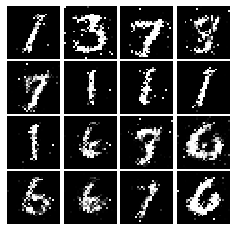

Epoch: 6, Iter: 2840, D: 0.2375, G:0.1967


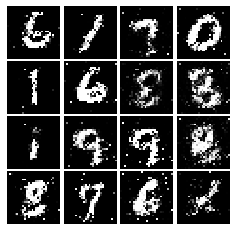

Epoch: 6, Iter: 2860, D: 0.1988, G:0.1881


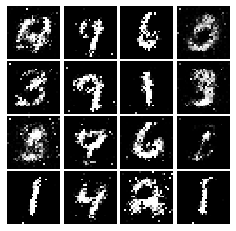

Epoch: 6, Iter: 2880, D: 0.2101, G:0.2303


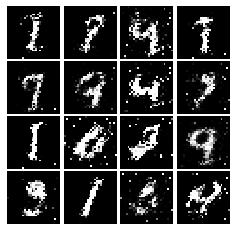

Epoch: 6, Iter: 2900, D: 0.2318, G:0.1958


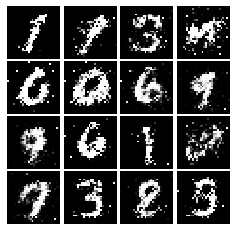

Epoch: 6, Iter: 2920, D: 0.2393, G:0.1955


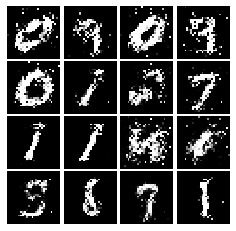

Epoch: 6, Iter: 2940, D: 0.2398, G:0.2086


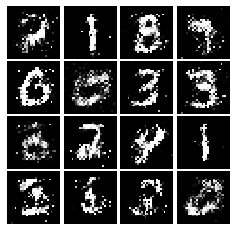

Epoch: 6, Iter: 2960, D: 0.2274, G:0.1771


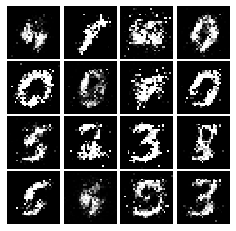

Epoch: 6, Iter: 2980, D: 0.229, G:0.1847


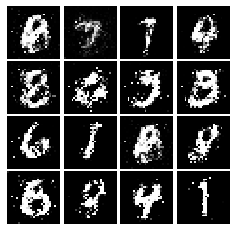

Epoch: 6, Iter: 3000, D: 0.2105, G:0.175


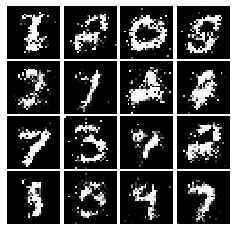

Epoch: 6, Iter: 3020, D: 0.2284, G:0.1748


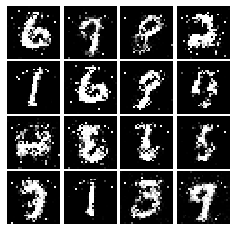

Epoch: 6, Iter: 3040, D: 0.2321, G:0.1926


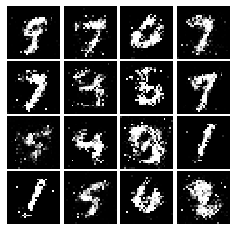

Epoch: 6, Iter: 3060, D: 0.2127, G:0.1694


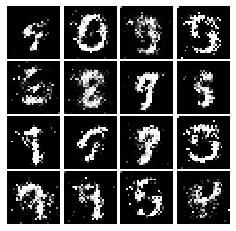

Epoch: 6, Iter: 3080, D: 0.2391, G:0.185


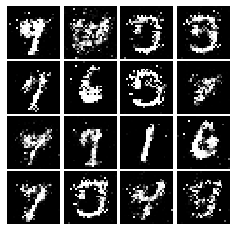

Epoch: 6, Iter: 3100, D: 0.2176, G:0.1905


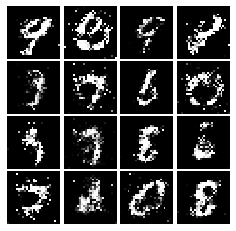

Epoch: 6, Iter: 3120, D: 0.2134, G:0.1913


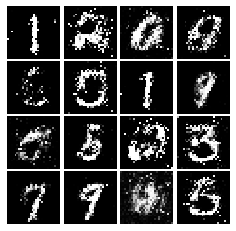

Epoch: 6, Iter: 3140, D: 0.2447, G:0.1601


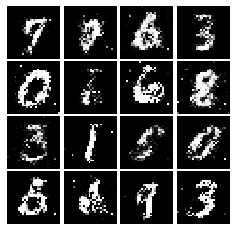

Epoch: 6, Iter: 3160, D: 0.2475, G:0.1894


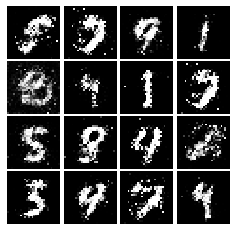

Epoch: 6, Iter: 3180, D: 0.2269, G:0.1802


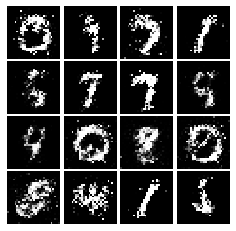

Epoch: 6, Iter: 3200, D: 0.2017, G:0.1965


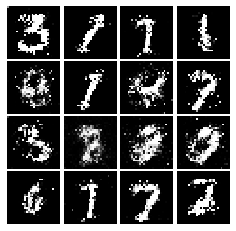

Epoch: 6, Iter: 3220, D: 0.2192, G:0.1939


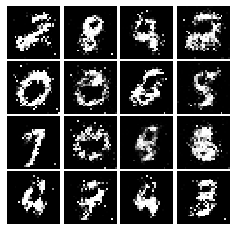

Epoch: 6, Iter: 3240, D: 0.2094, G:0.1695


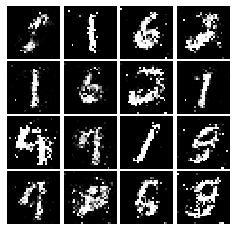

Epoch: 6, Iter: 3260, D: 0.2295, G:0.1741


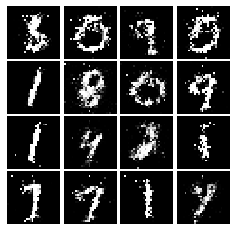

Epoch: 6, Iter: 3280, D: 0.21, G:0.1716


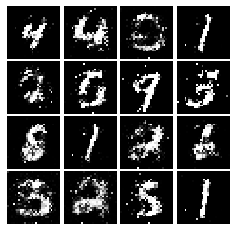

Epoch: 7, Iter: 3300, D: 0.2102, G:0.1909


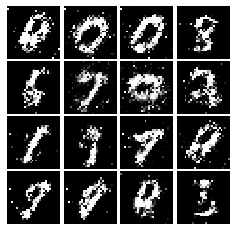

Epoch: 7, Iter: 3320, D: 0.2266, G:0.1911


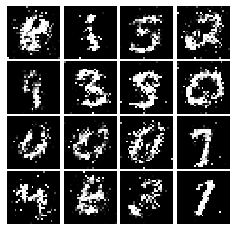

Epoch: 7, Iter: 3340, D: 0.2097, G:0.1931


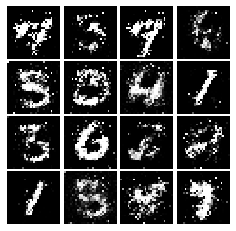

Epoch: 7, Iter: 3360, D: 0.2381, G:0.1555


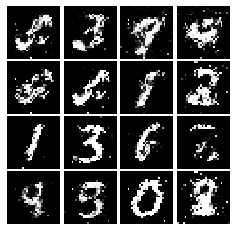

Epoch: 7, Iter: 3380, D: 0.2446, G:0.1893


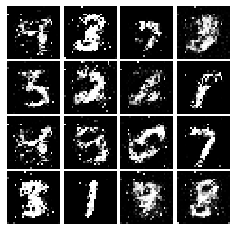

Epoch: 7, Iter: 3400, D: 0.2306, G:0.1981


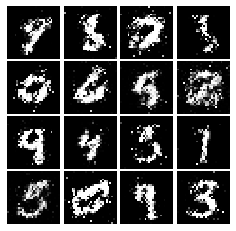

Epoch: 7, Iter: 3420, D: 0.2215, G:0.1613


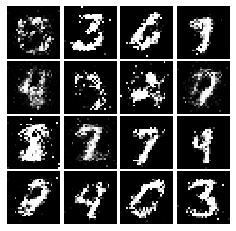

Epoch: 7, Iter: 3440, D: 0.237, G:0.1738


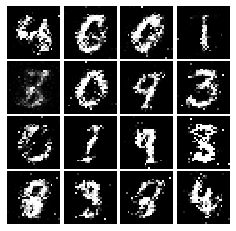

Epoch: 7, Iter: 3460, D: 0.2142, G:0.1731


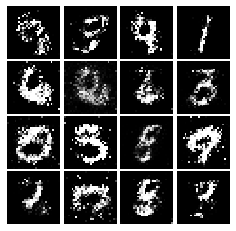

Epoch: 7, Iter: 3480, D: 0.2249, G:0.164


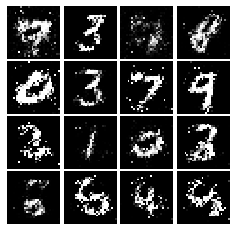

Epoch: 7, Iter: 3500, D: 0.2359, G:0.1622


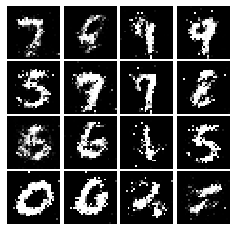

Epoch: 7, Iter: 3520, D: 0.2193, G:0.1566


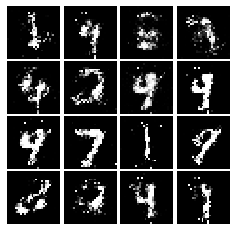

Epoch: 7, Iter: 3540, D: 0.2232, G:0.176


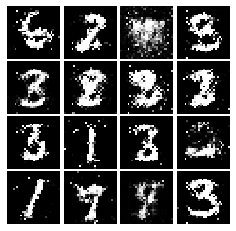

Epoch: 7, Iter: 3560, D: 0.225, G:0.1761


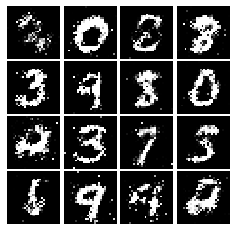

Epoch: 7, Iter: 3580, D: 0.2266, G:0.1708


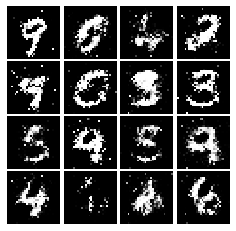

Epoch: 7, Iter: 3600, D: 0.2515, G:0.1576


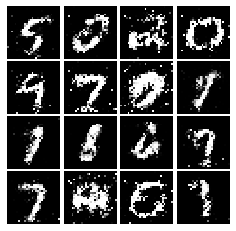

Epoch: 7, Iter: 3620, D: 0.229, G:0.1676


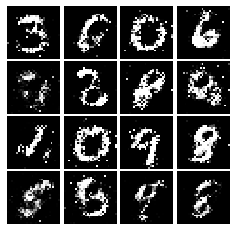

Epoch: 7, Iter: 3640, D: 0.2583, G:0.1678


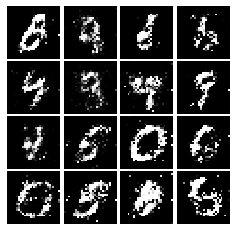

Epoch: 7, Iter: 3660, D: 0.2233, G:0.1567


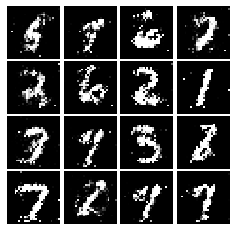

Epoch: 7, Iter: 3680, D: 0.2469, G:0.1694


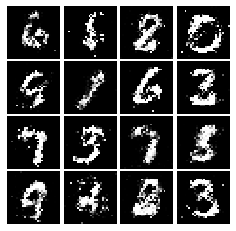

Epoch: 7, Iter: 3700, D: 0.2384, G:0.1498


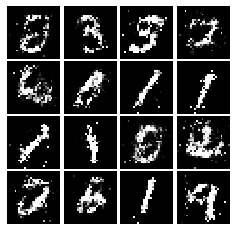

Epoch: 7, Iter: 3720, D: 0.219, G:0.1649


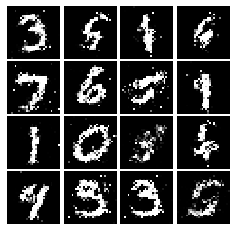

Epoch: 7, Iter: 3740, D: 0.2395, G:0.1527


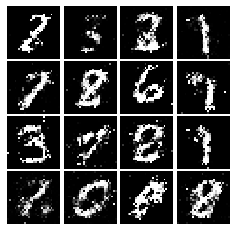

Epoch: 8, Iter: 3760, D: 0.2478, G:0.1613


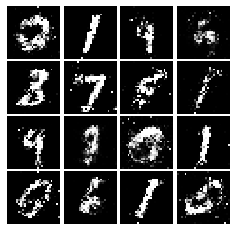

Epoch: 8, Iter: 3780, D: 0.2287, G:0.1735


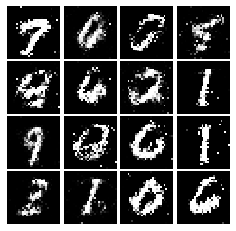

Epoch: 8, Iter: 3800, D: 0.2277, G:0.1748


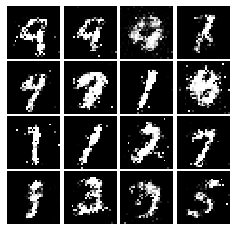

Epoch: 8, Iter: 3820, D: 0.2237, G:0.1415


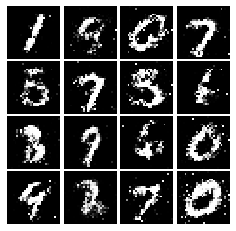

Epoch: 8, Iter: 3840, D: 0.2648, G:0.1566


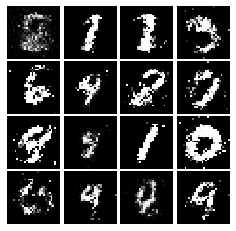

Epoch: 8, Iter: 3860, D: 0.2267, G:0.1742


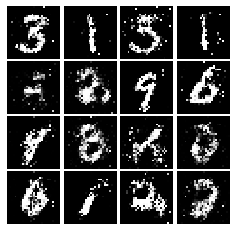

Epoch: 8, Iter: 3880, D: 0.221, G:0.1578


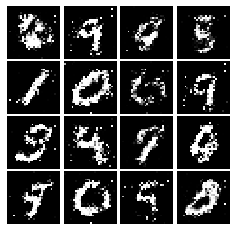

Epoch: 8, Iter: 3900, D: 0.2334, G:0.1664


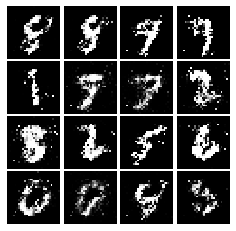

Epoch: 8, Iter: 3920, D: 0.2028, G:0.2029


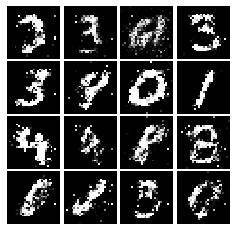

Epoch: 8, Iter: 3940, D: 0.2349, G:0.1562


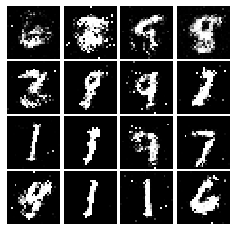

Epoch: 8, Iter: 3960, D: 0.2388, G:0.1417


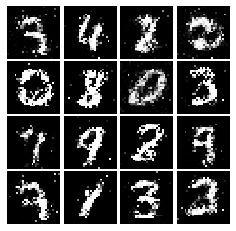

Epoch: 8, Iter: 3980, D: 0.24, G:0.1633


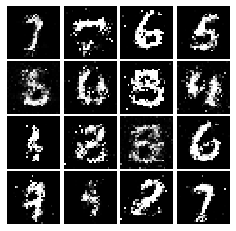

Epoch: 8, Iter: 4000, D: 0.2107, G:0.1939


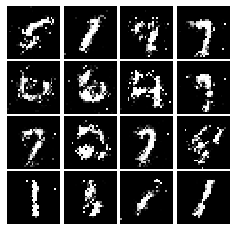

Epoch: 8, Iter: 4020, D: 0.2605, G:0.1392


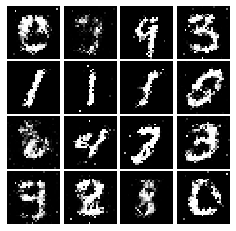

Epoch: 8, Iter: 4040, D: 0.2178, G:0.1807


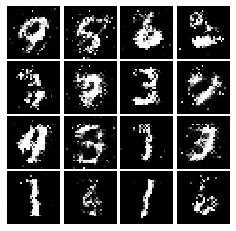

Epoch: 8, Iter: 4060, D: 0.2287, G:0.1711


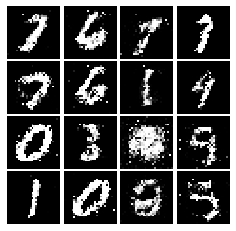

Epoch: 8, Iter: 4080, D: 0.2497, G:0.1615


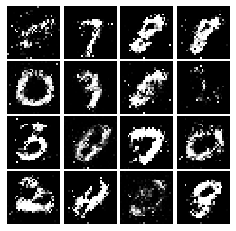

Epoch: 8, Iter: 4100, D: 0.2427, G:0.162


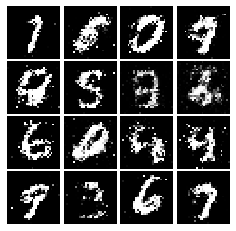

Epoch: 8, Iter: 4120, D: 0.2163, G:0.1485


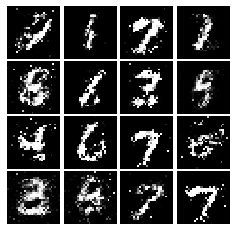

Epoch: 8, Iter: 4140, D: 0.2302, G:0.1487


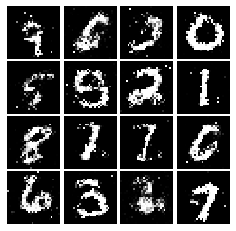

Epoch: 8, Iter: 4160, D: 0.2238, G:0.1627


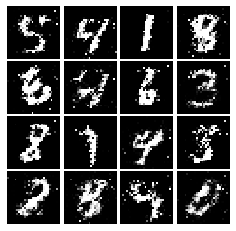

Epoch: 8, Iter: 4180, D: 0.2388, G:0.1593


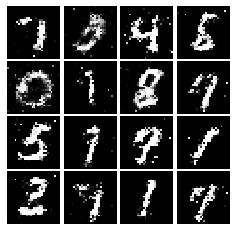

Epoch: 8, Iter: 4200, D: 0.2255, G:0.1684


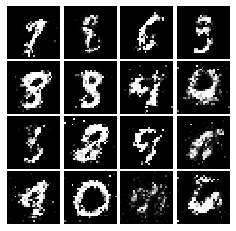

Epoch: 8, Iter: 4220, D: 0.2044, G:0.1793


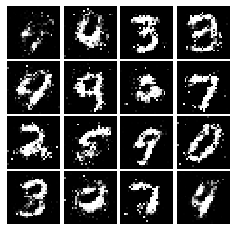

Epoch: 9, Iter: 4240, D: 0.2389, G:0.179


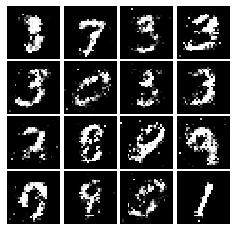

Epoch: 9, Iter: 4260, D: 0.2395, G:0.1707


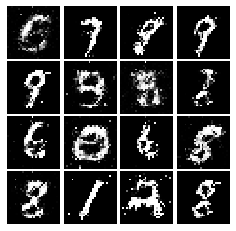

Epoch: 9, Iter: 4280, D: 0.2659, G:0.1543


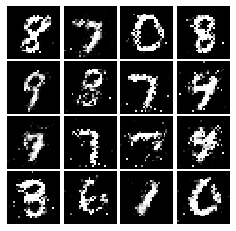

Epoch: 9, Iter: 4300, D: 0.2538, G:0.1702


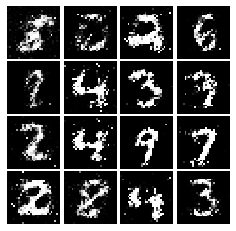

Epoch: 9, Iter: 4320, D: 0.2509, G:0.1582


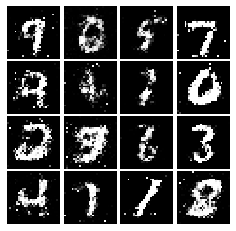

Epoch: 9, Iter: 4340, D: 0.24, G:0.1461


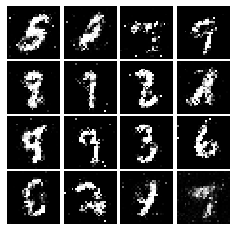

Epoch: 9, Iter: 4360, D: 0.2526, G:0.1458


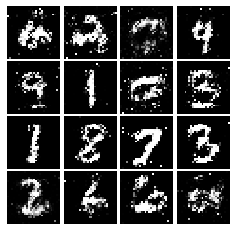

Epoch: 9, Iter: 4380, D: 0.238, G:0.1393


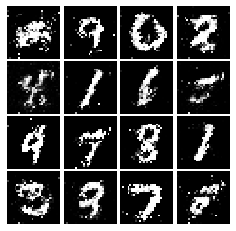

Epoch: 9, Iter: 4400, D: 0.2475, G:0.183


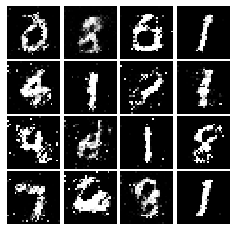

Epoch: 9, Iter: 4420, D: 0.2402, G:0.15


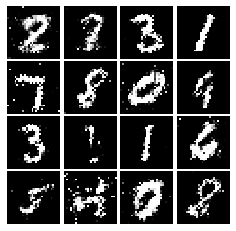

Epoch: 9, Iter: 4440, D: 0.2382, G:0.1516


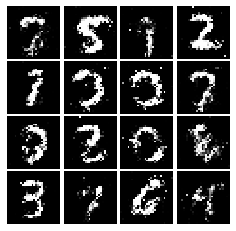

Epoch: 9, Iter: 4460, D: 0.2311, G:0.1653


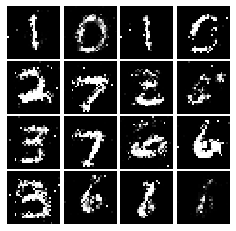

Epoch: 9, Iter: 4480, D: 0.2107, G:0.1931


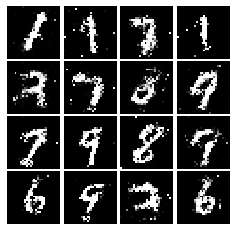

Epoch: 9, Iter: 4500, D: 0.2496, G:0.1293


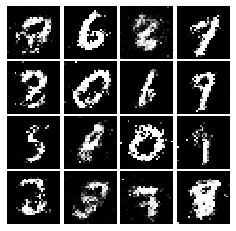

Epoch: 9, Iter: 4520, D: 0.2278, G:0.1621


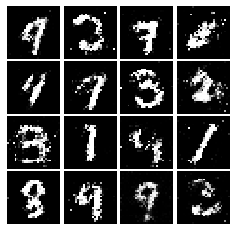

Epoch: 9, Iter: 4540, D: 0.2433, G:0.1483


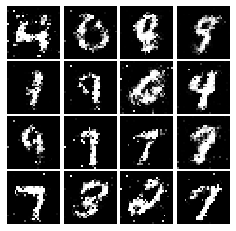

Epoch: 9, Iter: 4560, D: 0.2352, G:0.1707


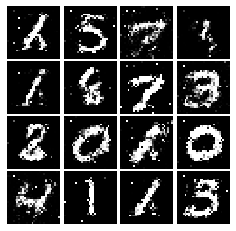

Epoch: 9, Iter: 4580, D: 0.2547, G:0.1533


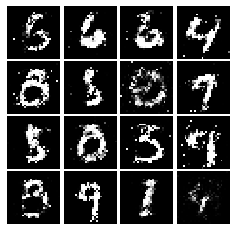

Epoch: 9, Iter: 4600, D: 0.2315, G:0.1451


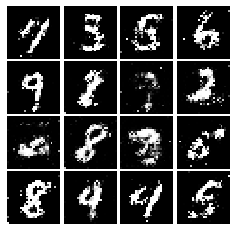

Epoch: 9, Iter: 4620, D: 0.2526, G:0.1634


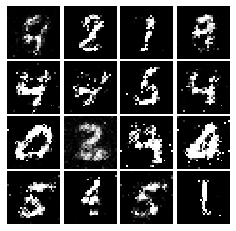

Epoch: 9, Iter: 4640, D: 0.2411, G:0.1597


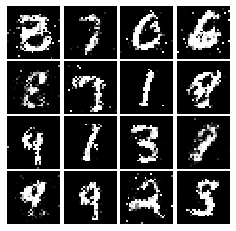

Epoch: 9, Iter: 4660, D: 0.234, G:0.1628


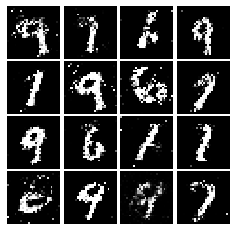

Epoch: 9, Iter: 4680, D: 0.2383, G:0.1724


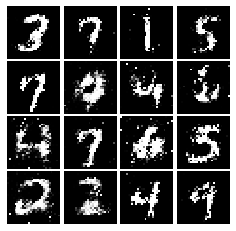

Final images


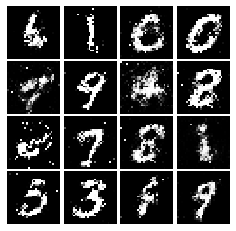

In [0]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, ls_discriminator_loss, ls_generator_loss)

# Deep Convolutional GANs
In the first part of the notebook, we implemented an almost direct copy of the original GAN network from Ian Goodfellow. However, this network architecture allows no real spatial reasoning. It is unable to reason about things like "sharp edges" in general because it lacks any convolutional layers. Thus, in this section, we will implement some of the ideas from [DCGAN](https://arxiv.org/abs/1511.06434), where we use convolutional networks as our discriminators and generators.

#### Discriminator
We will use a discriminator inspired by the TensorFlow MNIST classification [tutorial](https://www.tensorflow.org/get_started/mnist/pros), which is able to get above 99% accuracy on the MNIST dataset fairly quickly. *Be sure to check the dimensions of x and reshape when needed*, fully connected blocks expect [N,D] Tensors while conv2d blocks expect [N,H,W,C] Tensors. Please use `tf.keras.layers` to define the following architecture:

Architecture:
* Conv2D: 32 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Conv2D: 64 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Flatten
* Fully Connected with output size 4 x 4 x 64
* Leaky ReLU(alpha=0.01)
* Fully Connected with output size 1

Once again, please use biases for all convolutional and fully connected layers, and use the default parameter initializers. Note that a padding of 0 can be accomplished with the 'VALID' padding option.

In [0]:
def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        tf.keras.layers.Reshape((28,28,1),input_shape=(784,)),  
        tf.keras.layers.Conv2D(32,5,strides=1,padding="valid",activation=leaky_relu),
        tf.keras.layers.MaxPool2D(2,strides=2),
        tf.keras.layers.Conv2D(64,5,strides=1,padding="valid",activation=leaky_relu),
        tf.keras.layers.MaxPool2D(2,strides=2),
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(4*4*64,activation=leaky_relu),
        tf.keras.layers.Dense(1)
        

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

model = discriminator()
test_discriminator(1102721)

Correct number of parameters in discriminator.


#### Generator
For the generator, we will copy the architecture exactly from the [InfoGAN paper](https://arxiv.org/pdf/1606.03657.pdf). See Appendix C.1 MNIST. Please use `tf.keras.layers` for your implementation. You might find the documentation for [tf.keras.layers.Conv2DTranspose](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/keras/layers/Conv2DTranspose) useful. The architecture is as follows.

Architecture:
* Fully connected with output size 1024 
* `ReLU`
* BatchNorm
* Fully connected with output size 7 x 7 x 128 
* `ReLU`
* BatchNorm
* Resize into Image Tensor of size 7, 7, 128
* Conv2D^T (transpose): 64 filters of 4x4, stride 2
* `ReLU`
* BatchNorm
* Conv2d^T (transpose): 1 filter of 4x4, stride 2
* `TanH`

Once again, use biases for the fully connected and transpose convolutional layers. Please use the default initializers for your parameters. For padding, choose the 'same' option for transpose convolutions. For Batch Normalization, assume we are always in 'training' mode.

In [69]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****



        tf.keras.layers.Dense(1024,activation=tf.nn.relu,input_shape=(noise_dim,)),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Dense(7*7*128 ,activation=tf.nn.relu),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Reshape((7,7,128)),
        tf.keras.layers.Conv2DTranspose(64,4,strides=2,padding="same",activation=tf.nn.relu),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Conv2DTranspose(1,4,strides=2,padding="same",activation=tf.nn.tanh)


        # tf.keras.layers.Reshape((28,28,1),input_shape=(784,)),  
        # tf.keras.layers.Conv2D(32,5,strides=1,padding="valid",activation=leaky_relu),
        # tf.keras.layers.MaxPool2D(2,strides=2),
        # tf.keras.layers.Conv2D(64,5,strides=1,padding="valid",activation=leaky_relu),
        # tf.keras.layers.MaxPool2D(2,strides=2),
        # tf.keras.layers.Flatten(),
        
        # tf.keras.layers.Dense(1) 

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model
test_generator(6595521)

Correct number of parameters in generator.



We have to recreate our network since we've changed our functions.

### Train and evaluate a DCGAN
This is the one part of A3 that significantly benefits from using a GPU. It takes 3 minutes on a GPU for the requested five epochs. Or about 50 minutes on a dual core laptop on CPU (feel free to use 3 epochs if you do it on CPU).

Epoch: 0, Iter: 0, D: 1.292, G:0.6422


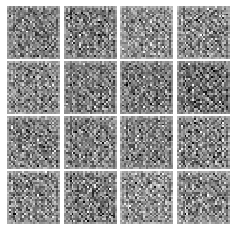

Epoch: 0, Iter: 20, D: 0.4482, G:1.322


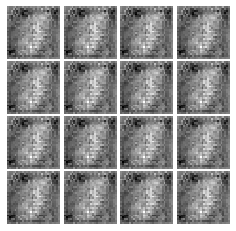

Epoch: 0, Iter: 40, D: 0.008872, G:4.933


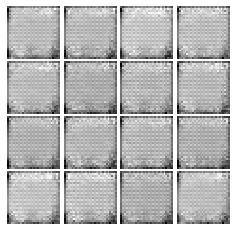

Epoch: 0, Iter: 60, D: 0.001501, G:6.677


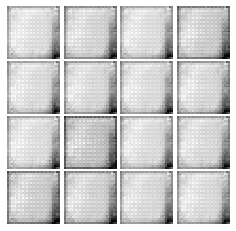

Epoch: 0, Iter: 80, D: 0.8675, G:1.366


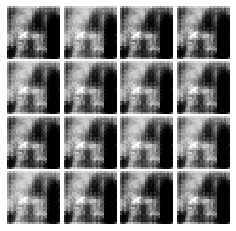

Epoch: 0, Iter: 100, D: 0.6663, G:2.559


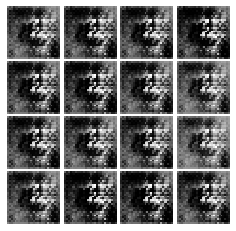

Epoch: 0, Iter: 120, D: 0.5245, G:3.918


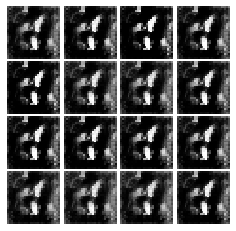

Epoch: 0, Iter: 140, D: 0.7744, G:2.324


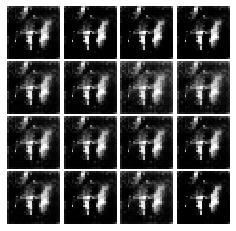

Epoch: 0, Iter: 160, D: 0.5666, G:3.328


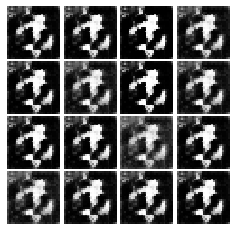

Epoch: 0, Iter: 180, D: 0.05796, G:4.26


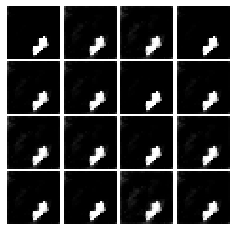

Epoch: 0, Iter: 200, D: 0.176, G:7.005


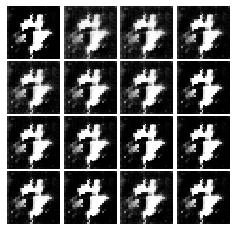

Epoch: 0, Iter: 220, D: 0.1026, G:4.201


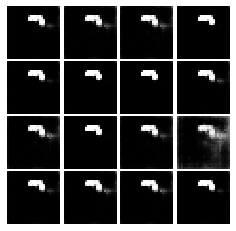

Epoch: 0, Iter: 240, D: 0.6795, G:3.784


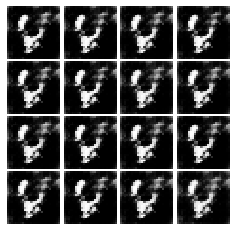

Epoch: 0, Iter: 260, D: 0.242, G:3.453


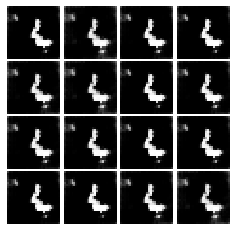

Epoch: 0, Iter: 280, D: 0.8267, G:2.052


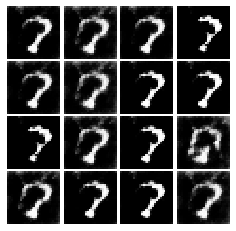

Epoch: 0, Iter: 300, D: 0.6758, G:5.219


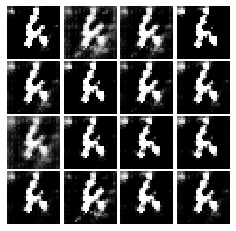

Epoch: 0, Iter: 320, D: 0.1623, G:3.618


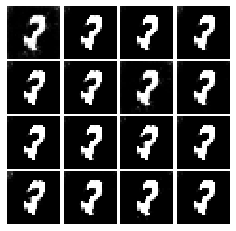

Epoch: 0, Iter: 340, D: 0.3134, G:3.39


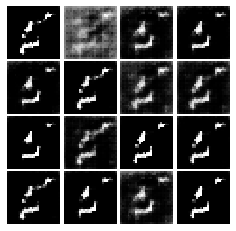

Epoch: 0, Iter: 360, D: 0.3341, G:2.332


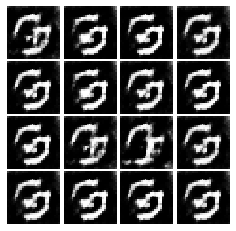

Epoch: 0, Iter: 380, D: 0.8694, G:2.608


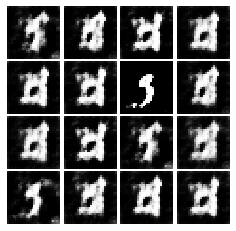

Epoch: 0, Iter: 400, D: 4.541, G:2.823


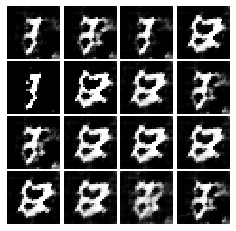

Epoch: 0, Iter: 420, D: 0.3395, G:3.178


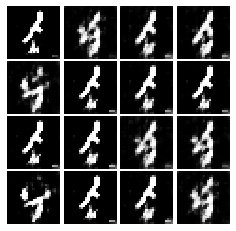

Epoch: 0, Iter: 440, D: 0.3672, G:3.707


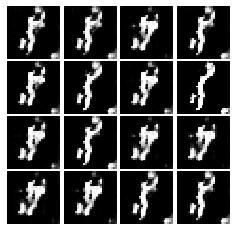

Epoch: 0, Iter: 460, D: 0.46, G:2.706


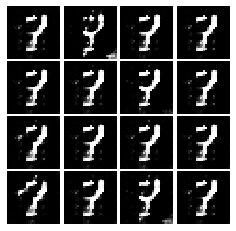

Epoch: 1, Iter: 480, D: 0.4094, G:3.668


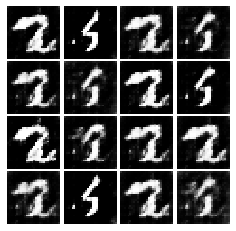

Epoch: 1, Iter: 500, D: 0.4992, G:3.079


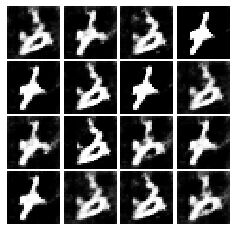

Epoch: 1, Iter: 520, D: 0.4991, G:2.238


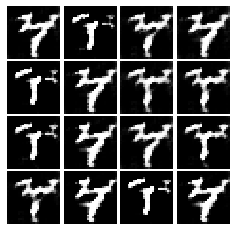

Epoch: 1, Iter: 540, D: 0.8584, G:2.474


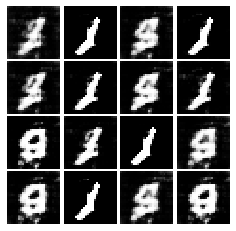

Epoch: 1, Iter: 560, D: 0.8588, G:2.989


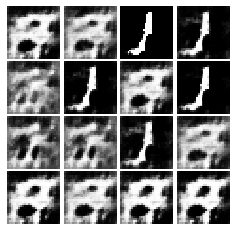

Epoch: 1, Iter: 580, D: 2.008, G:2.34


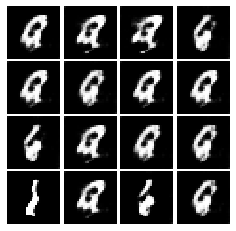

Epoch: 1, Iter: 600, D: 0.3681, G:4.013


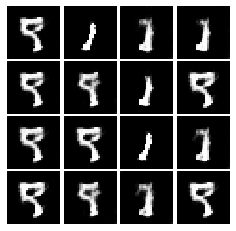

Epoch: 1, Iter: 620, D: 0.2588, G:2.361


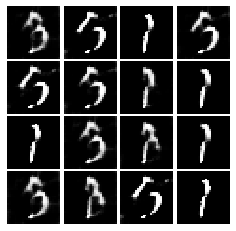

Epoch: 1, Iter: 640, D: 1.163, G:3.679


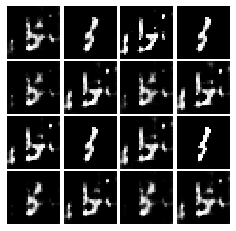

Epoch: 1, Iter: 660, D: 0.16, G:4.621


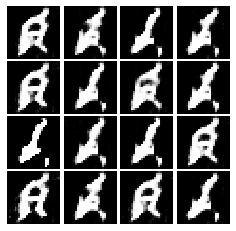

Epoch: 1, Iter: 680, D: 0.125, G:3.317


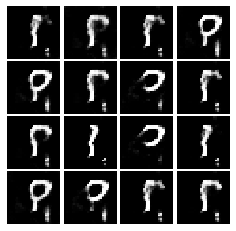

Epoch: 1, Iter: 700, D: 0.6935, G:2.551


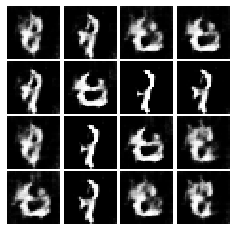

Epoch: 1, Iter: 720, D: 0.2533, G:3.634


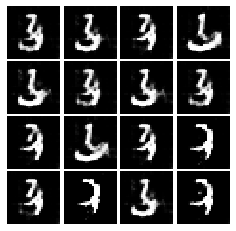

Epoch: 1, Iter: 740, D: 0.4955, G:2.619


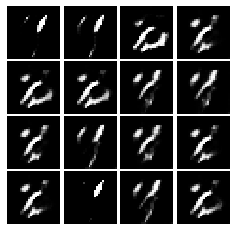

Epoch: 1, Iter: 760, D: 0.1143, G:4.641


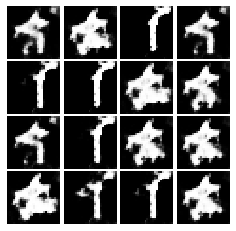

Epoch: 1, Iter: 780, D: 0.3526, G:4.456


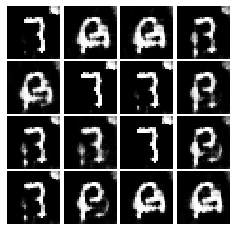

Epoch: 1, Iter: 800, D: 0.5529, G:2.634


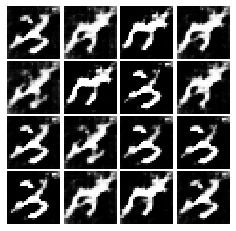

Epoch: 1, Iter: 820, D: 0.2184, G:1.791


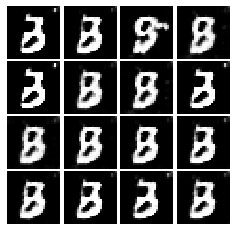

Epoch: 1, Iter: 840, D: 0.4429, G:4.522


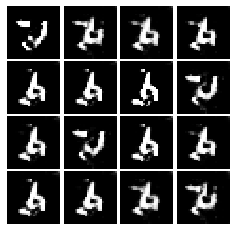

Epoch: 1, Iter: 860, D: 0.4645, G:3.544


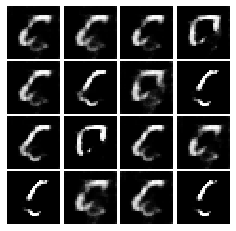

Epoch: 1, Iter: 880, D: 0.5077, G:2.534


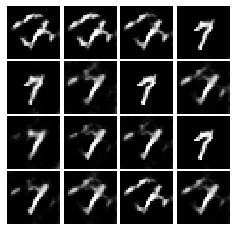

Epoch: 1, Iter: 900, D: 0.7091, G:2.342


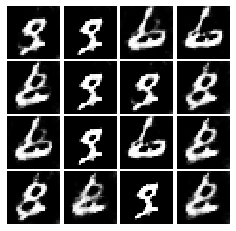

Epoch: 1, Iter: 920, D: 0.244, G:3.64


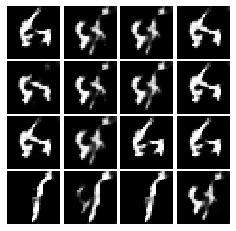

Epoch: 2, Iter: 940, D: 0.5618, G:2.086


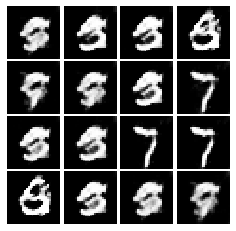

Epoch: 2, Iter: 960, D: 0.3713, G:2.444


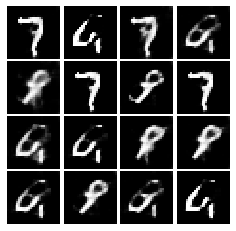

Epoch: 2, Iter: 980, D: 0.7113, G:3.947


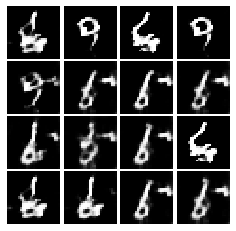

Epoch: 2, Iter: 1000, D: 0.7156, G:4.174


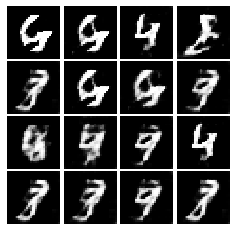

Epoch: 2, Iter: 1020, D: 0.3527, G:2.55


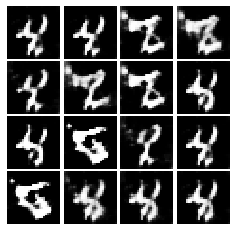

Epoch: 2, Iter: 1040, D: 0.4455, G:3.351


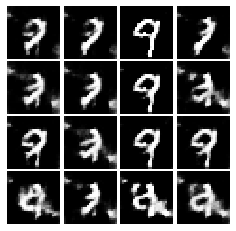

Epoch: 2, Iter: 1060, D: 0.3887, G:3.623


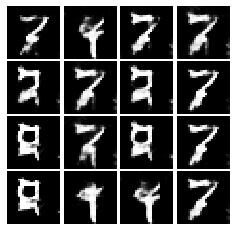

Epoch: 2, Iter: 1080, D: 0.6894, G:1.737


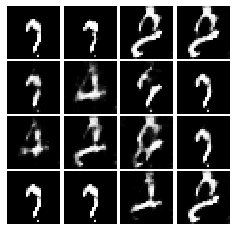

Epoch: 2, Iter: 1100, D: 0.1783, G:2.611


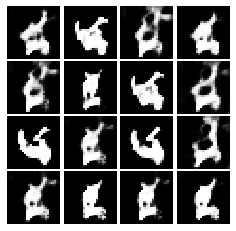

Epoch: 2, Iter: 1120, D: 0.6091, G:3.223


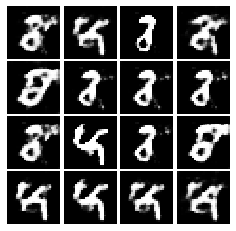

Epoch: 2, Iter: 1140, D: 0.2922, G:2.749


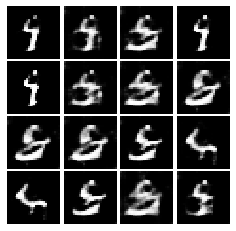

Epoch: 2, Iter: 1160, D: 0.6567, G:2.196


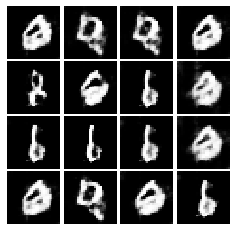

Epoch: 2, Iter: 1180, D: 0.7471, G:4.891


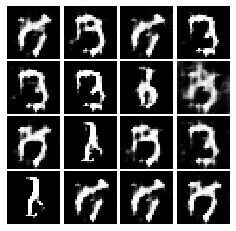

Epoch: 2, Iter: 1200, D: 0.4859, G:2.218


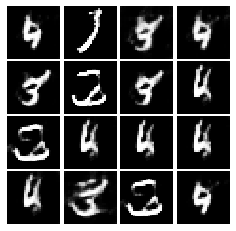

Epoch: 2, Iter: 1220, D: 0.6722, G:1.48


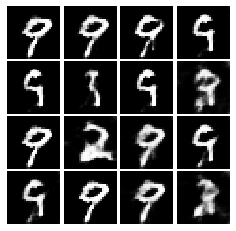

Epoch: 2, Iter: 1240, D: 0.4915, G:2.608


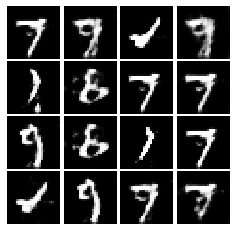

Epoch: 2, Iter: 1260, D: 0.5847, G:2.728


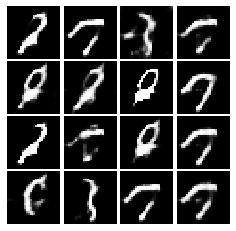

Epoch: 2, Iter: 1280, D: 0.5827, G:2.696


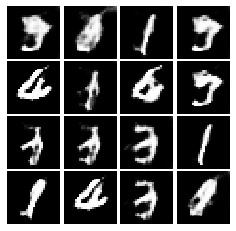

Epoch: 2, Iter: 1300, D: 0.581, G:2.434


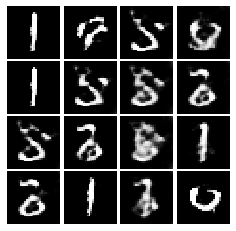

Epoch: 2, Iter: 1320, D: 0.6073, G:2.214


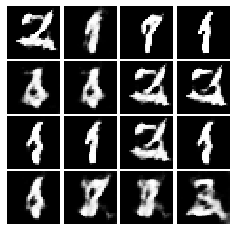

Epoch: 2, Iter: 1340, D: 0.3485, G:3.058


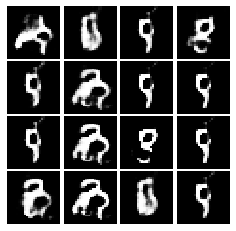

Epoch: 2, Iter: 1360, D: 0.2409, G:3.554


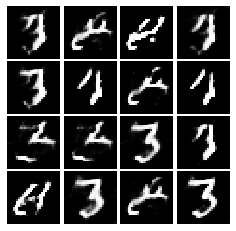

Epoch: 2, Iter: 1380, D: 0.3656, G:2.503


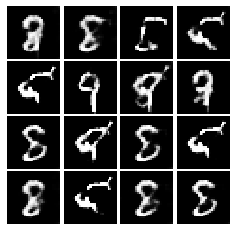

Epoch: 2, Iter: 1400, D: 0.1405, G:3.408


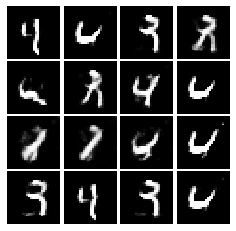

Epoch: 3, Iter: 1420, D: 0.2401, G:2.908


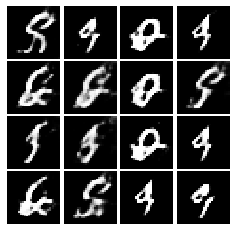

Epoch: 3, Iter: 1440, D: 0.4692, G:2.252


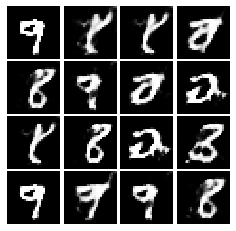

Epoch: 3, Iter: 1460, D: 0.4032, G:2.31


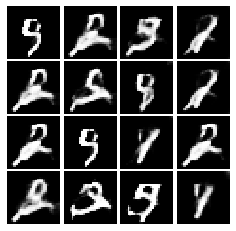

Epoch: 3, Iter: 1480, D: 0.2464, G:2.595


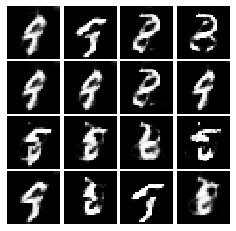

Epoch: 3, Iter: 1500, D: 1.036, G:2.699


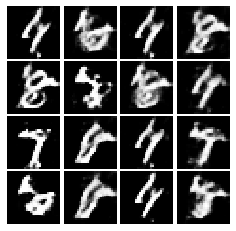

Epoch: 3, Iter: 1520, D: 0.3941, G:2.998


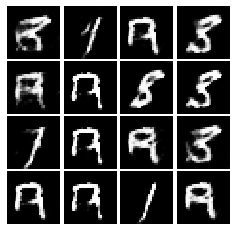

Epoch: 3, Iter: 1540, D: 0.7975, G:2.86


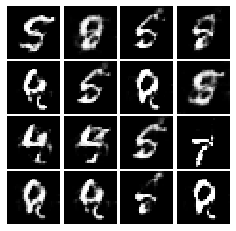

Epoch: 3, Iter: 1560, D: 0.3611, G:2.619


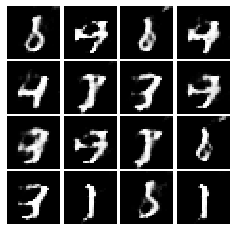

Epoch: 3, Iter: 1580, D: 0.3576, G:2.275


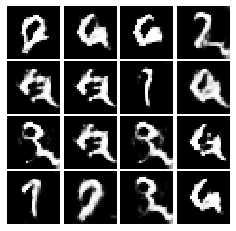

Epoch: 3, Iter: 1600, D: 0.6385, G:1.459


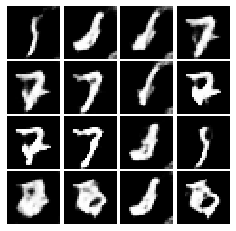

Epoch: 3, Iter: 1620, D: 0.6166, G:4.063


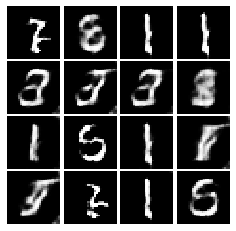

Epoch: 3, Iter: 1640, D: 0.5078, G:3.77


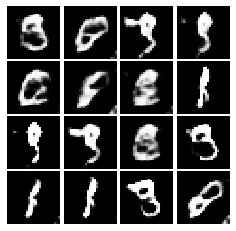

Epoch: 3, Iter: 1660, D: 1.035, G:4.486


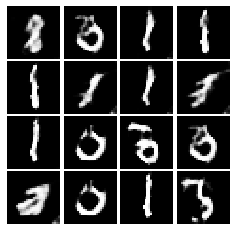

Epoch: 3, Iter: 1680, D: 0.6956, G:2.236


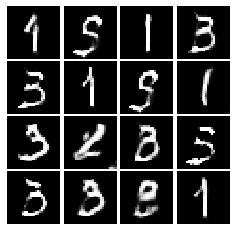

Epoch: 3, Iter: 1700, D: 0.4058, G:2.73


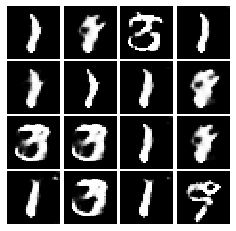

Epoch: 3, Iter: 1720, D: 0.3856, G:2.371


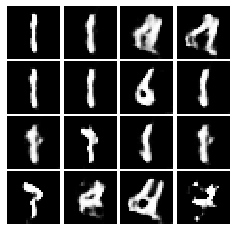

Epoch: 3, Iter: 1740, D: 0.7768, G:2.416


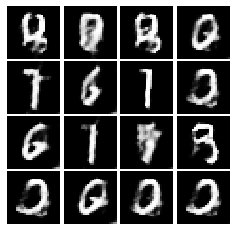

Epoch: 3, Iter: 1760, D: 0.6967, G:1.933


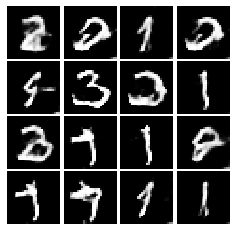

Epoch: 3, Iter: 1780, D: 0.6927, G:2.927


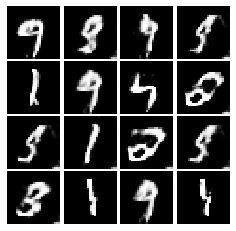

Epoch: 3, Iter: 1800, D: 0.7341, G:1.647


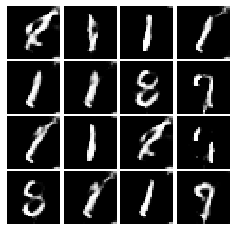

Epoch: 3, Iter: 1820, D: 0.5854, G:2.15


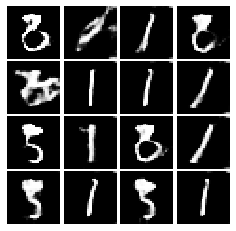

Epoch: 3, Iter: 1840, D: 0.5169, G:2.902


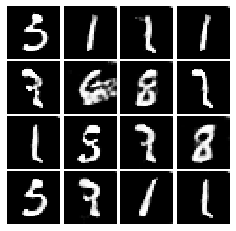

Epoch: 3, Iter: 1860, D: 0.6268, G:2.32


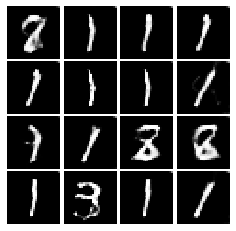

Epoch: 4, Iter: 1880, D: 0.4367, G:2.881


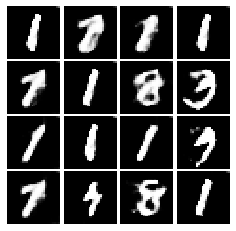

Epoch: 4, Iter: 1900, D: 0.5523, G:2.357


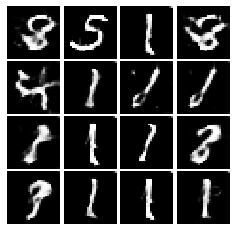

Epoch: 4, Iter: 1920, D: 0.5024, G:2.116


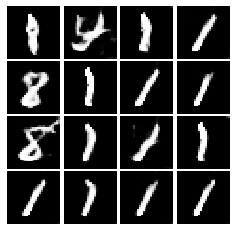

Epoch: 4, Iter: 1940, D: 0.3467, G:2.662


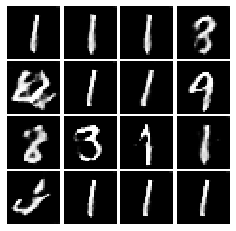

Epoch: 4, Iter: 1960, D: 0.4685, G:2.682


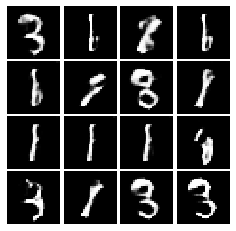

Epoch: 4, Iter: 1980, D: 0.5658, G:2.152


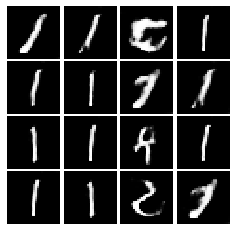

Epoch: 4, Iter: 2000, D: 0.7178, G:1.121


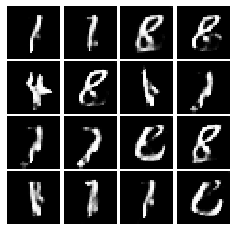

Epoch: 4, Iter: 2020, D: 0.374, G:2.636


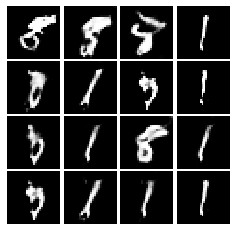

Epoch: 4, Iter: 2040, D: 0.6401, G:2.596


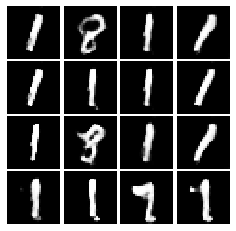

Epoch: 4, Iter: 2060, D: 0.38, G:3.702


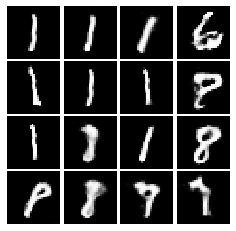

Epoch: 4, Iter: 2080, D: 0.5483, G:1.846


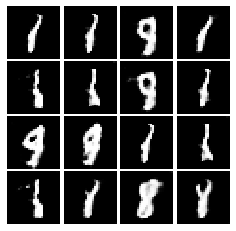

Epoch: 4, Iter: 2100, D: 0.3636, G:2.74


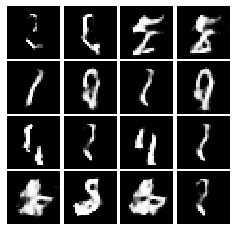

Epoch: 4, Iter: 2120, D: 0.5545, G:2.087


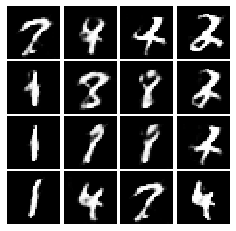

Epoch: 4, Iter: 2140, D: 0.553, G:2.047


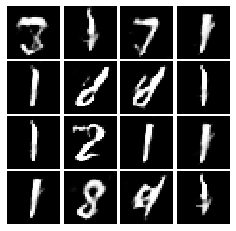

Epoch: 4, Iter: 2160, D: 0.6793, G:2.15


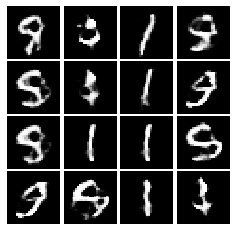

Epoch: 4, Iter: 2180, D: 0.5512, G:3.093


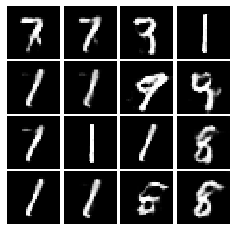

Epoch: 4, Iter: 2200, D: 0.5887, G:2.487


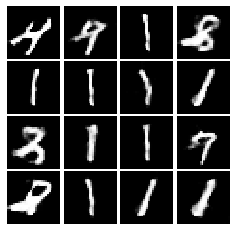

Epoch: 4, Iter: 2220, D: 0.385, G:2.728


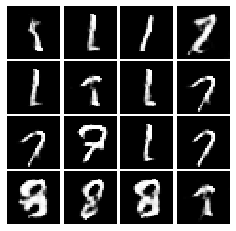

Epoch: 4, Iter: 2240, D: 0.5391, G:2.42


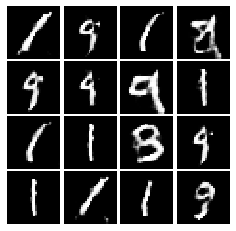

Epoch: 4, Iter: 2260, D: 0.6324, G:2.441


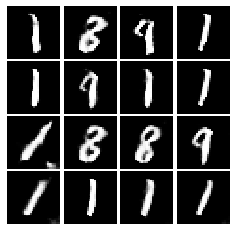

Epoch: 4, Iter: 2280, D: 0.6427, G:2.118


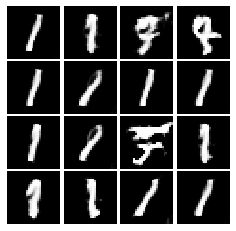

Epoch: 4, Iter: 2300, D: 0.419, G:2.451


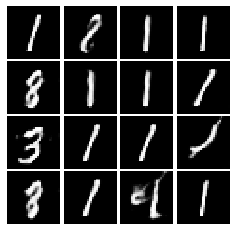

Epoch: 4, Iter: 2320, D: 0.2974, G:2.741


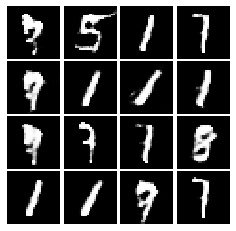

Epoch: 4, Iter: 2340, D: 0.6243, G:2.931


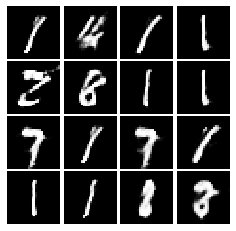

Final images


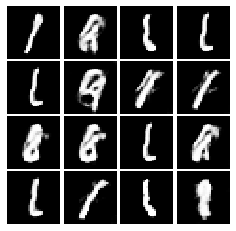

In [70]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss, num_epochs=5)

## INLINE QUESTION 1

We will look at an example to see why alternating minimization of the same objective (like in a GAN) can be tricky business.

Consider $f(x,y)=xy$. What does $\min_x\max_y f(x,y)$ evaluate to? (Hint: minmax tries to minimize the maximum value achievable.)

Now try to evaluate this function numerically for 6 steps, starting at the point $(1,1)$, 
by using alternating gradient (first updating y, then updating x using that updated y) with step size $1$. **Here step size is the learning_rate, and steps will be learning_rate * gradient.**
You'll find that writing out the update step in terms of $x_t,y_t,x_{t+1},y_{t+1}$ will be useful.

Breifly explain what $\min_x\max_y f(x,y)$ evaluates to and record the six pairs of explicit values for $(x_t,y_t)$ in the table below.

### Your answer:
 
 $y_0$ | $y_1$ | $y_2$ | $y_3$ | $y_4$ | $y_5$ | $y_6$ 
 ----- | ----- | ----- | ----- | ----- | ----- | ----- 
   1   |2       | 1      |  -1     |  -2     |  -1     |1       
 $x_0$ | $x_1$ | $x_2$ | $x_3$ | $x_4$ | $x_5$ | $x_6$ 
   1   | -1      |  -2     |  -1     |  1     |    2   |1       
   


## INLINE QUESTION 2
Using this method, will we ever reach the optimal value? Why or why not?

### Your answer: 
We can't. Starting from (1,1), we run in to a cycle and will return to starting point. Thus we can't reach the optimal value.

## INLINE QUESTION 3
If the generator loss decreases during training while the discriminator loss stays at a constant high value from the start, is this a good sign? Why or why not? A qualitative answer is sufficient.

### Your answer: 
Not a good sign. Because the discriminator is trying to distinguish real images and generated images. If it doesn't decrease to a be better classifier, the generator can easily fool the classifier and get a low loss, although the generated image is still bad.

*Many thanks to Stanford CS231n for permission to use their materials!*